In [1]:
from __future__ import print_function, division
import scipy


import keras
from keras.datasets import mnist
#from keras_contrib.layers.normalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam, SGD
import datetime
import matplotlib.pyplot as plt
import sys
from data_loader import DataLoader
import numpy as np
import os
from glob import glob

Using Theano backend.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.
Using cuDNN version 5110 on context None
Mapped name None to device cuda: TITAN X (Pascal) (0000:01:00.0)


In [2]:
def gen_data(f_mean_shift=(2,3), fvar=2, g_mean_shift=(-1,-1), gvar=0.5, num_pts=10000, mean=(0,0), var=1.0, batch_size=1):
        #data_type = "train%s" % domain if not is_testing else "test%s" % domain
        cov=var*np.eye(2)
        orig = np.random.multivariate_normal(mean, cov, num_pts)
        fmean=np.asarray(mean)+np.asarray(f_mean_shift)
        fpts= np.random.multivariate_normal(fmean, fvar*cov, num_pts)
        gmean=np.asarray(mean)+np.asarray(g_mean_shift)
        gpts=np.random.multivariate_normal(gmean, gvar*cov, num_pts)

        return orig, fpts, gpts

In [3]:
#translate from one determinisitcally generated distribution to another 
def translate_pt(a_pt, a_mean=(2,3), avar=2, b_mean=(-1,-1), bvar=0.5, mean=(0,0), var=1.0):
    #think of the point-mean as a vector that is scaled by the variance of the distribution 
    vec=(np.asarray(a_pt)-np.asarray(a_mean))
    #divide by the original dist's variance, re-scale by the new variance
    #the shift the vector to its new starting place, the mean of the target distribution
    b_trans_pt=np.asarray(np.asarray((np.asarray(vec)/avar))*bvar)+np.asarray(b_mean)
    return b_trans_pt



In [83]:
class CycleGAN():
    def __init__(self, data_A, data_B, lr_G=0.001, lr_D=0.0005, lambda_cycle=1, 
                 disclossconst=1, idloss=0.01, disclossfunc='binary_crossentropy', seed=997):
        
        #
        self.data_shape=(2,)
        self.data_dim=2
        self.disclossconst=disclossconst
        self.idloss=idloss
        self.disclossfunc=disclossfunc
        self.seed=seed

        # Loss weights
        ##################################
        # First change: set cycle-consistency weight to unit.
        # Could probably do the same to identity-loss weight
        # without much change, but the lambda_cycle weight
        # did seem to have an effect
        ##################################
        self.lambda_cycle = lambda_cycle                    # Cycle-consistency loss
        self.lambda_id = self.idloss * self.lambda_cycle    # Identity loss

        ##################################
        # Second change: optimizers
        # Start with SGD on easy data, then consider using Adam/RMSprop when you
        # get a feel for how training will go. The former is simpler and more
        # predictable, the latter can be erratic if you don't understand how to
        # set the hyperparameters.
        #
        # And then: different learning rates for generator and discriminator.
        # I'm suspicious of anyone who doesn't do this unless the discriminator
        # is non-sigmoid.
        # I'm suspicious of non-sigmoid discriminators except Wasserstein GAN.
        ##################################
        optimizer_G = SGD(lr=lr_G)
        optimizer_D = SGD(lr=lr_D)

        ##################################
        # Third change: discriminator loss
        # The original CycleGAN authors used MSE instead of BCE.
        # They cited some paper I've never heard of which claimed
        # that it encourages stability.
        # This sounds like a poor-man's Wasserstein GAN without
        # any of the analysis to back it up, FWIW.
        # Switched back to BCE because we know it works on
        # other types of GANs.
        #
        # ALSO: The discriminator's output layer had a sigmoid
        # activation, which doesn't make sense with MSE.
        # If you look in the original cyclegan.py, the
        # discriminator's final layer was the default activation,
        # which is linear. This makes more sense with MSE.
        # I also tried leaving MSE loss, and making the discriminator's
        # last activation linear, but that didn't work as well.
        ##################################
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])
        self.d_B.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------
        np.random.seed(self.seed)
        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input instances from both domains
        datum_A = Input(shape=self.data_shape)
        datum_B = Input(shape=self.data_shape)


        #Is this going to work the way I have it here
        #or should I be taking something from a batch?
        # Translate images to the other domain
        fake_B = self.g_AB(datum_A)
        fake_A = self.g_BA(datum_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        datum_A_id = self.g_BA(datum_A)
        datum_B_id = self.g_AB(datum_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        ##################################
        # Third change (part two): consistent switch to BCE
        # for all discriminator losses
        ##################################
        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[datum_A, datum_B],
                              outputs=[ valid_A, valid_B,
                                        reconstr_A, reconstr_B,
                                        datum_A_id, datum_B_id ])
        self.combined.compile(loss=[self.disclossfunc, self.disclossfunc,
                                    'mae', 'mae',
                                    'mae', 'mae'],
                            loss_weights=[  self.disclossconst, self.disclossconst,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id ],
                            optimizer=optimizer_G)

    

    def build_generator(self):
        """
        Simple MLP generator for the MoG unrolled GAN toy experiment
        """

        gen_input = Input(shape=(self.data_dim,), name="generator_input")

        ##################################
        # Fourth change: made this tanh instead of relu.
        # I suspect the important thing is to have similar activations
        # in generator and discriminator, but who knows.
        # Could also try relu in both, but I would use LeakyReLU.
        ##################################
        x = Dense(2*self.data_dim)(gen_input)
        x = Activation("tanh")(x)
     #     for i in range(2):
        x = Dense(2*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(2)(gen_input)
        

        generator_model = Model(inputs=[gen_input], outputs=[x])
        #visualize_model(generator_model)

        return generator_model

#        
    def build_discriminator(self):

        """
        Simple MLP discriminator for the MoG unrolled GAN toy experiment
        """

        disc_input = Input(shape=(2,), name="discriminator_input")

        x = Dense(2*self.data_dim)(disc_input)
        x = Activation("tanh")(x)
    #     for i in range(2):
        x = Dense(2*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(1, activation="sigmoid")(x)

        discriminator_model = Model(inputs=[disc_input], outputs=[x])
        #visualize_model(discriminator_model)

        #is there a difference between what this returns and the original cycelgan does?
        return discriminator_model

    
    def train(self, epochs, batch_size=1, sample_interval=50):

        start_time = datetime.datetime.now()
        np.random.seed(self.seed)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,)) #+ self.disc_patch)
        fake = np.zeros((batch_size,)) #+ self.disc_patch)
#         self.g_AB.summary()
#         self.g_BA.summary()
#         self.d_A.summary()
#         self.d_B.summary()
        self.n_batches = int(min(len(data_A), len(data_B)) / batch_size)
        #total_samples = self.n_batches * batch_size
        for epoch in range(epochs):
            for i in range(self.n_batches-1):
                #randomly shuffle data?
                
                #take the corresponding "Batch size" number of elements
                batch_A = data_A[i*batch_size:(i+1)*batch_size]
                batch_B = data_B[i*batch_size:(i+1)*batch_size]
                #put them through this thing
                
                
                # ----------------------
                #  Train Discriminators
                # ----------------------
               # print(imgs_A.shape)

                # Translate images to opposite domain
                fake_B = self.g_AB.predict(batch_A)
                fake_A = self.g_BA.predict(batch_B)
                #print(fake_A.shape)
                #print(fake_B.shape)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(batch_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(batch_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)


                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([batch_A, batch_B],
                                                        [valid, valid,
                                                        batch_A, batch_B,
                                                        batch_A, batch_B])

                elapsed_time = datetime.datetime.now() - start_time
                
                #question: when you call predict on a generator, does it return elements
                #in the same order you send them in?
                #because i'm assuming here that fake_a[i] will correspond to batch_b[i]. IS this true?
                #until I know, I'll stick to batch size 1 always
                translation_acc_AB=np.asarray([])
                translation_acc_BA=np.asarray([])
                translation_max_BA=np.asarray([])
                translation_min_AB=np.asarray([])
                #computes the average euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_acc_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()))
                translation_acc_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()))
                
                #computes the minimum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_min_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).min()))
                translation_min_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).min()))
                
                #computes the maximum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_max_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).max()))
                translation_max_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).max()))
    
                # Plot the progress
            if epoch % sample_interval == 0:
                print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] \n  [Translation AB Dist: %f BA Dist: %f Min AB Dist: %f Max AB: %f Min BA: %fMax BA: %f] \n [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                                                                        % ( epoch, epochs,
                                                                            i, self.n_batches,
                                                                            d_loss[0], 100*d_loss[1],
                                                                            np.asarray(translation_acc_AB).mean(),
                                                                            np.asarray(translation_acc_BA).mean(),
                                                                            np.asarray(translation_min_AB).mean(),
                                                                            np.asarray(translation_max_AB).mean(),
                                                                            np.asarray(translation_min_BA).mean(),
                                                                            np.asarray(translation_max_BA).mean(),
                                                                            g_loss[0], 
                                                                            np.mean(g_loss[1:3]),
                                                                            np.mean(g_loss[3:5]),
                                                                            np.mean(g_loss[5:6]),
                                                                            elapsed_time))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_data(epoch, i)

    def sample_data(self, epoch, batch_i):
       # r, c = 2, 3

        orig2, pic_data_A, pic_data_B= gen_data((10,10), 3, (-7,6), .25, 1000)
        
    
        # Translate images to the other domain
        fake_B = self.g_AB.predict(pic_data_A)
        fake_A = self.g_BA.predict(pic_data_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)
        
        #give the translation accuracy for a random element
        #I'm not doing the average because I'm not sure the fake and real correspond 1-1
        #I can change this later if I think they do
        num=np.random.randint(len(fake_A[0]))
        trans_acc_AB= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_A[num])), fake_B[num])])
        trans_acc_BA= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_B[num])), fake_A[num])])
#         translation_acc_AB.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(a)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()
#         translation_acc_BA.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(b)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()
    
        #print("[Trans Dist AB: %d Dist: %d]" \ %(trans_acc_AB, trans_acc_BA))
        
        
        #means and variances
        #(are vars computed right? I did it along one axis because I think they're the same on both) 
        #for real and generated distributions
        fakeA_mean=[np.mean(np.asarray(fake_A[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeA_var=np.asarray(fake_A[:,0]).var()
        realA_mean=[np.mean(np.asarray(pic_data_A[:,0])), np.mean(np.asarray(pic_data_A[:,1]))]
        realA_var=np.asarray(pic_data_A[:,0]).var()
        print("[Fake A Mean: (%d, %d) Fake A Var: %d A Mean: (%d, %d) A Var: %d ]"  
              %(fakeA_mean[0], fakeA_mean[1], fakeA_var, realA_mean[0], realA_mean[1], realA_var))
        
        fakeB_mean=[np.mean(np.asarray(fake_B[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeB_var=np.asarray(fake_B[:,0]).var()
        realB_mean=[np.mean(np.asarray(pic_data_B[:,0])), np.mean(np.asarray(pic_data_B[:,1]))]
        realB_var=np.asarray(pic_data_B[:,0]).var()
        print("[Fake B Mean: (%d, %d) Fake B Var: %d B Mean: (%d, %d) B Var: %d ]"  
              %(fakeB_mean[0], fakeB_mean[1], fakeB_var, realB_mean[0], realB_mean[1], realB_var))
        
        fig = plt.figure(figsize=(12,7))
        ax1 = fig.add_subplot(131)

        ax1.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax1.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax1.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        plt.legend(loc='upper left');
        
        ax2=fig.add_subplot(132)
        ax2.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='b', marker="s", label='OB')
        ax2.scatter(fake_B[:,0], fake_B[:,1], s=25, c='r', marker="o", label='FB')
        ax2.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='g', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        ax3=fig.add_subplot(133)
        ax3.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax3.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax3.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        ax3.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='c', marker="s", label='OB')
        ax3.scatter(fake_B[:,0], fake_B[:,1], s=25, c='m', marker="o", label='FB')
        ax3.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='y', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        plt.show()
        plt.clf()
        fig.savefig("images/%d_%d.png" % (epoch, batch_i))
        plt.close()

In [7]:
orig, data_A, data_B=gen_data((10,10), 3, (-7,6), .25, 1000)

Tried to Reproduce Matt's results with my new "translation accuracy" function, which returns the euclidean distance between the point that should have been generated and the point that was actually generated.
I also returned the mean+variance of the fake/real distributions,

[Epoch 0/1000] [Batch 248/250] [D loss: 0.543668, acc:  75%] [Translation AB Dist: 8.644926 BA Dist: 12.745528 Min AB Dist: 8.476995 Max BA: 16.124790][G loss: 2.771166, adv: 1.147887, recon: 0.116586, id: 21.049974] time: 0:00:02.454749 
[Fake A Mean: (-2, 13) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-10, 13) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


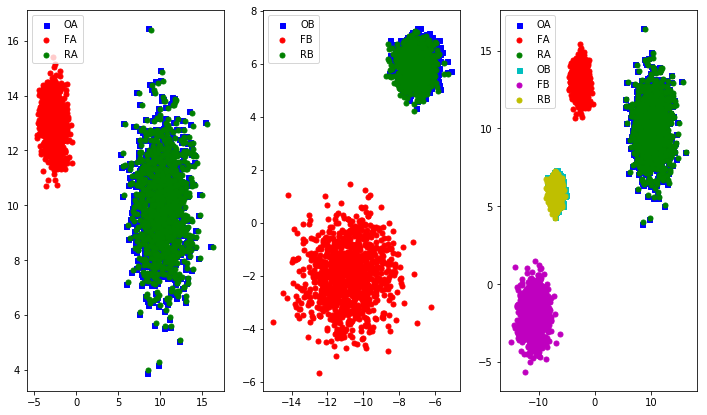

[Epoch 50/1000] [Batch 248/250] [D loss: 0.679534, acc:  31%] [Translation AB Dist: 1.748763 BA Dist: 4.556692 Min AB Dist: 1.483076 Max BA: 7.916898][G loss: 1.795674, adv: 0.696189, recon: 0.109047, id: 12.833798] time: 0:00:33.306053 
[Fake A Mean: (8, 8) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-8, 8) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


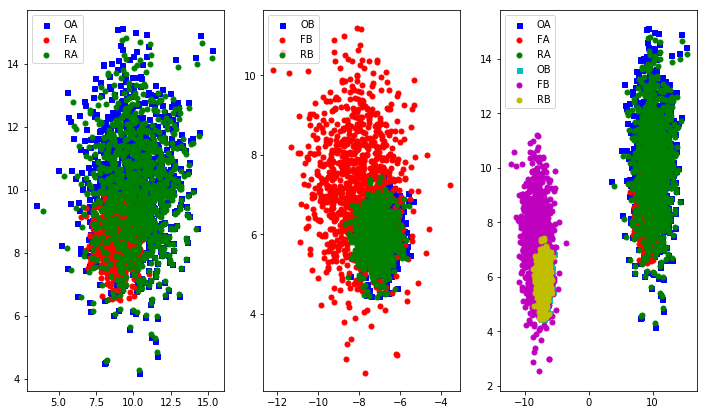

[Epoch 100/1000] [Batch 248/250] [D loss: 0.709606, acc:  18%] [Translation AB Dist: 0.557433 BA Dist: 3.933907 Min AB Dist: 0.381253 Max BA: 6.624102][G loss: 1.921319, adv: 0.653122, recon: 0.197320, id: 16.445839] time: 0:01:04.244700 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


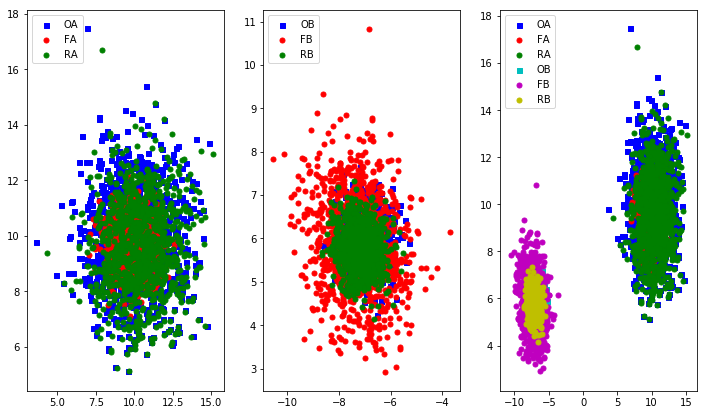

[Epoch 150/1000] [Batch 248/250] [D loss: 0.703747, acc:  31%] [Translation AB Dist: 0.603331 BA Dist: 4.003225 Min AB Dist: 0.447593 Max BA: 6.811190][G loss: 2.190481, adv: 0.676618, recon: 0.297362, id: 18.889774] time: 0:01:34.991755 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


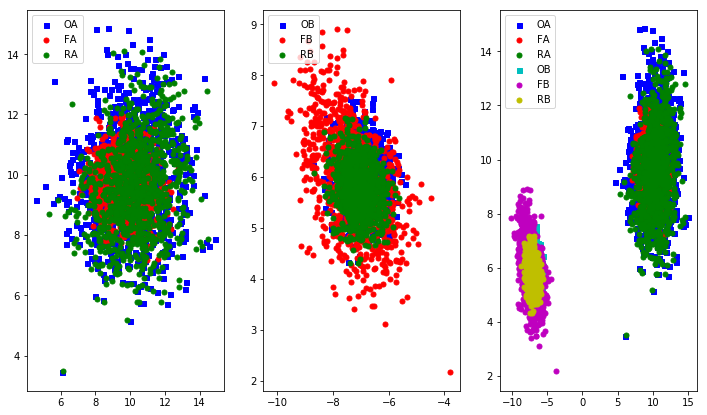

[Epoch 200/1000] [Batch 248/250] [D loss: 0.705784, acc:  31%] [Translation AB Dist: 0.580068 BA Dist: 4.030300 Min AB Dist: 0.432356 Max BA: 6.846787][G loss: 2.187780, adv: 0.674769, recon: 0.294987, id: 19.688496] time: 0:02:05.806533 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


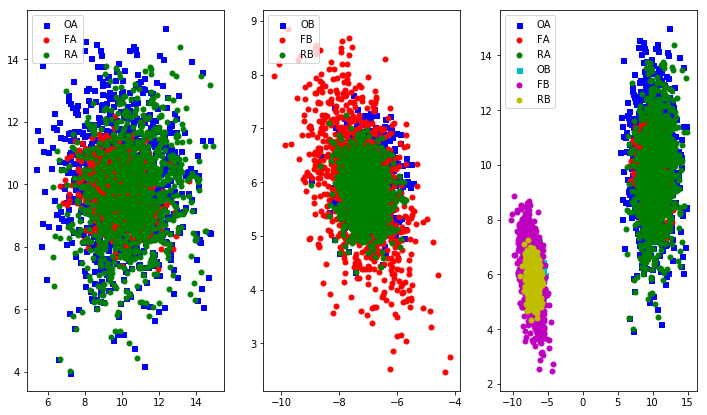

[Epoch 250/1000] [Batch 248/250] [D loss: 0.699858, acc:  31%] [Translation AB Dist: 0.611376 BA Dist: 4.081179 Min AB Dist: 0.472416 Max BA: 6.924799][G loss: 2.348151, adv: 0.687346, recon: 0.362981, id: 19.935146] time: 0:02:36.625659 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


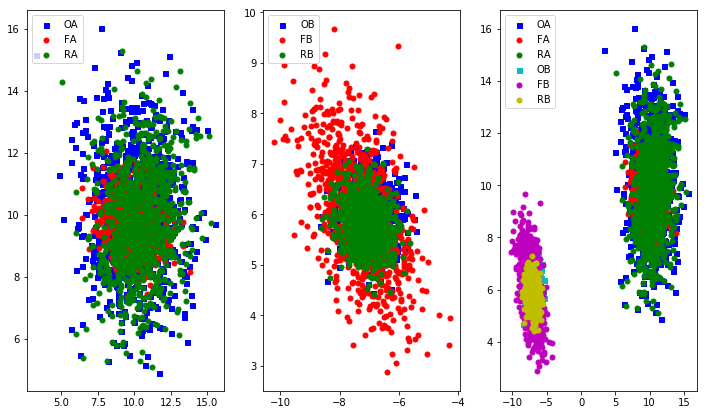

[Epoch 300/1000] [Batch 248/250] [D loss: 0.700180, acc:  31%] [Translation AB Dist: 0.593197 BA Dist: 4.082277 Min AB Dist: 0.449182 Max BA: 6.932032][G loss: 2.340970, adv: 0.685845, recon: 0.361420, id: 19.923080] time: 0:03:07.464239 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


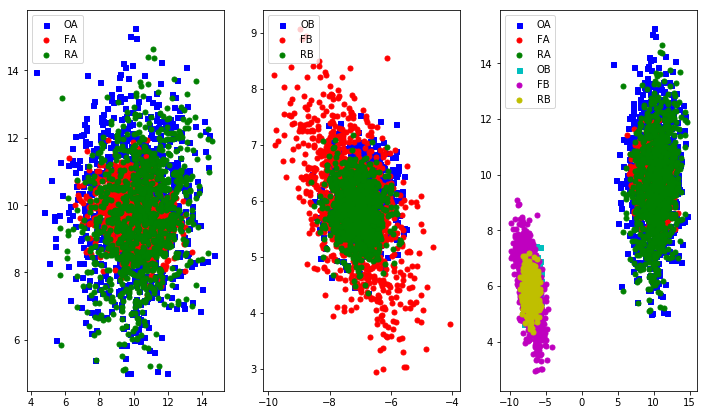

[Epoch 350/1000] [Batch 248/250] [D loss: 0.706427, acc:  31%] [Translation AB Dist: 0.542709 BA Dist: 4.056975 Min AB Dist: 0.405148 Max BA: 6.905674][G loss: 2.212322, adv: 0.674698, recon: 0.308947, id: 19.828510] time: 0:03:38.341529 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


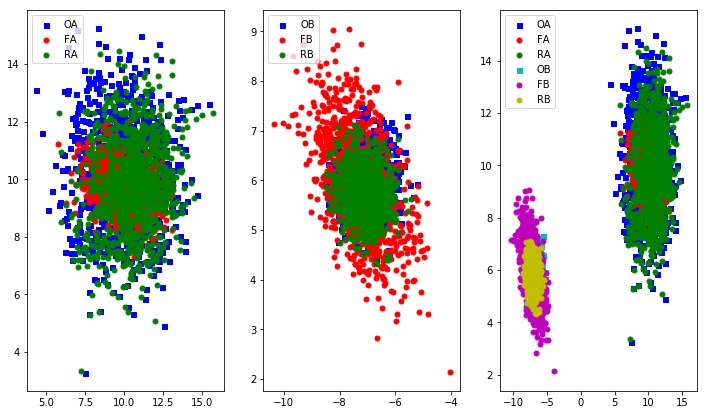

[Epoch 400/1000] [Batch 248/250] [D loss: 0.698600, acc:  31%] [Translation AB Dist: 0.614739 BA Dist: 4.082492 Min AB Dist: 0.479887 Max BA: 6.936760][G loss: 2.338510, adv: 0.689079, recon: 0.358317, id: 19.669132] time: 0:04:09.158345 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


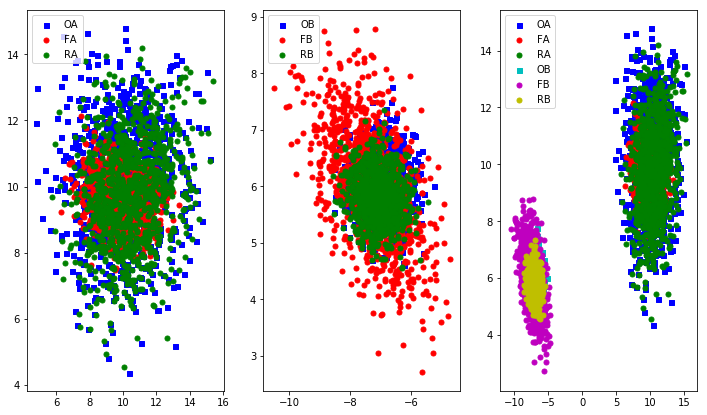

[Epoch 450/1000] [Batch 248/250] [D loss: 0.704301, acc:  31%] [Translation AB Dist: 0.620185 BA Dist: 4.088877 Min AB Dist: 0.456855 Max BA: 6.956998][G loss: 2.244053, adv: 0.677795, recon: 0.323319, id: 19.492300] time: 0:04:40.119574 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


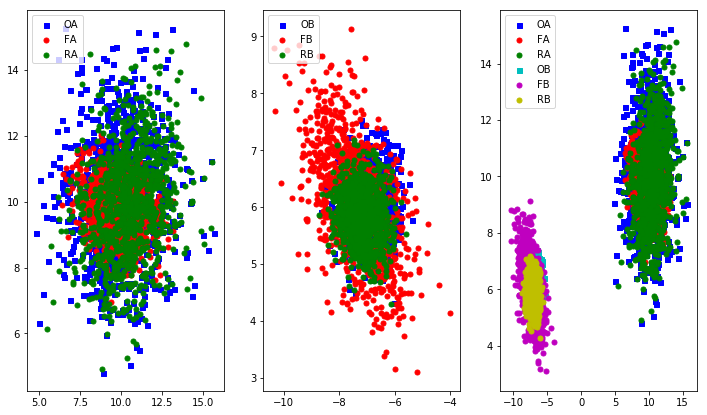

[Epoch 500/1000] [Batch 248/250] [D loss: 0.700621, acc:  31%] [Translation AB Dist: 0.596547 BA Dist: 4.062402 Min AB Dist: 0.461932 Max BA: 6.920332][G loss: 2.300044, adv: 0.683986, recon: 0.345497, id: 19.426907] time: 0:05:10.898805 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


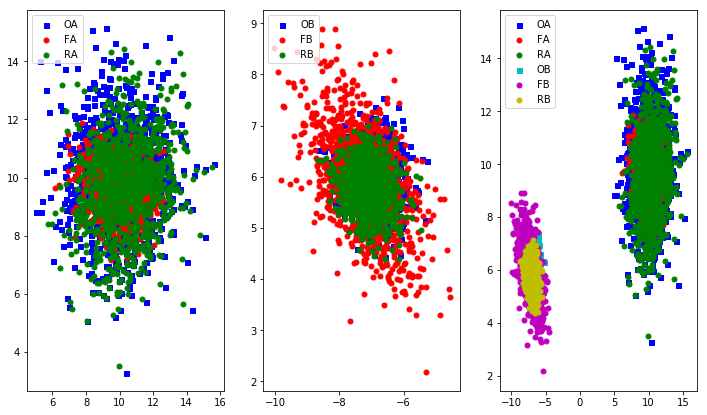

[Epoch 550/1000] [Batch 248/250] [D loss: 0.733195, acc:  31%] [Translation AB Dist: 0.482042 BA Dist: 3.993995 Min AB Dist: 0.297498 Max BA: 6.838454][G loss: 1.847762, adv: 0.623634, recon: 0.180496, id: 19.281303] time: 0:05:41.838929 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


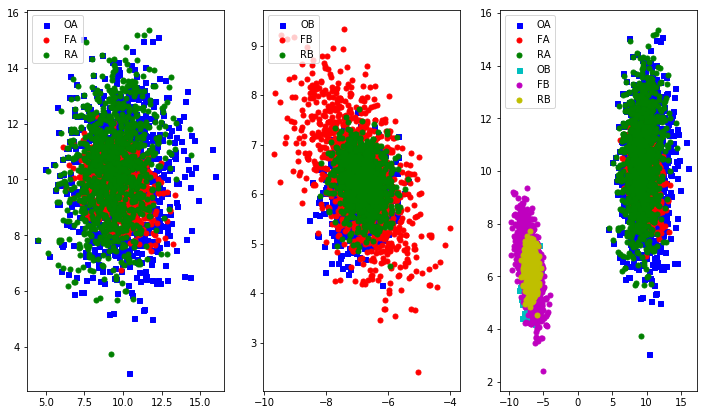

[Epoch 600/1000] [Batch 248/250] [D loss: 0.690087, acc:  43%] [Translation AB Dist: 0.735568 BA Dist: 4.105326 Min AB Dist: 0.564996 Max BA: 7.010430][G loss: 2.314796, adv: 0.723277, recon: 0.315133, id: 19.152273] time: 0:06:12.739089 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


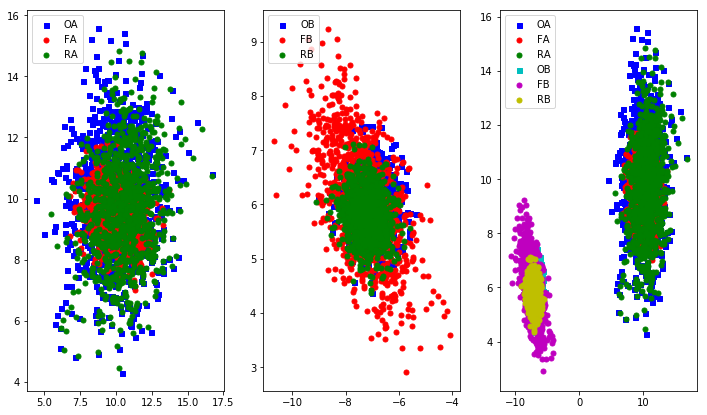

[Epoch 650/1000] [Batch 248/250] [D loss: 0.705585, acc:  50%] [Translation AB Dist: 0.587225 BA Dist: 4.024371 Min AB Dist: 0.445157 Max BA: 6.909565][G loss: 2.108382, adv: 0.698096, recon: 0.237099, id: 19.067041] time: 0:06:43.658568 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


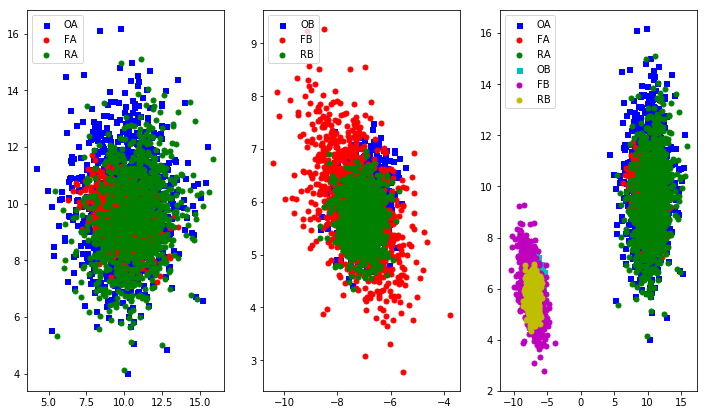

[Epoch 700/1000] [Batch 248/250] [D loss: 0.699732, acc:  56%] [Translation AB Dist: 0.640243 BA Dist: 4.057635 Min AB Dist: 0.497316 Max BA: 6.922213][G loss: 2.315078, adv: 0.714894, recon: 0.323621, id: 19.142475] time: 0:07:14.443365 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


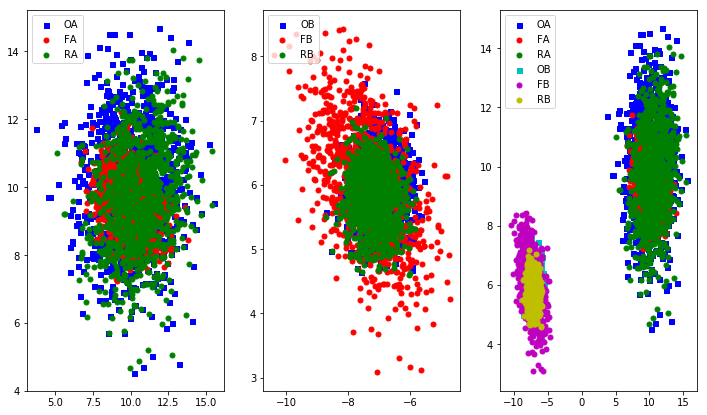

[Epoch 750/1000] [Batch 248/250] [D loss: 0.735980, acc:  43%] [Translation AB Dist: 0.445986 BA Dist: 3.946369 Min AB Dist: 0.249777 Max BA: 6.808377][G loss: 1.839166, adv: 0.642931, recon: 0.157955, id: 19.102623] time: 0:07:45.585095 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


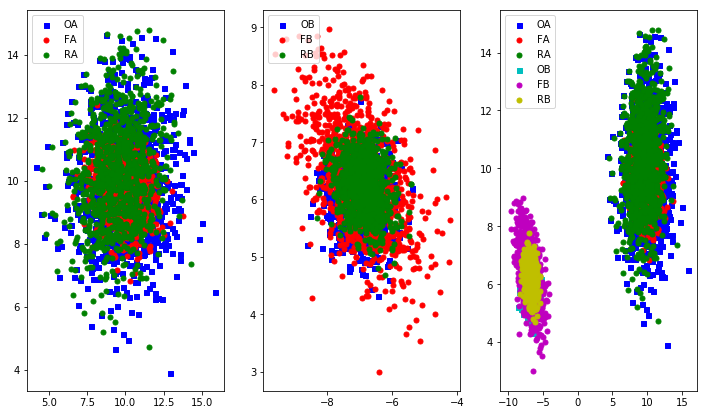

[Epoch 800/1000] [Batch 248/250] [D loss: 0.707965, acc:  56%] [Translation AB Dist: 0.549676 BA Dist: 4.006081 Min AB Dist: 0.430838 Max BA: 6.872985][G loss: 2.164796, adv: 0.700925, recon: 0.262929, id: 19.067883] time: 0:08:16.392946 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


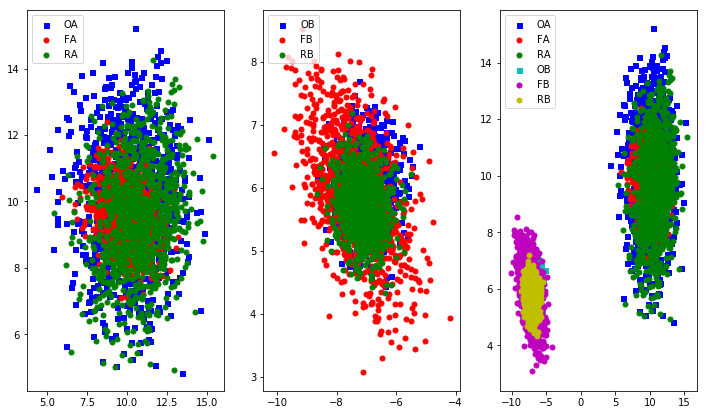

[Epoch 850/1000] [Batch 248/250] [D loss: 0.706647, acc:  56%] [Translation AB Dist: 0.578242 BA Dist: 4.011363 Min AB Dist: 0.448721 Max BA: 6.863934][G loss: 2.151551, adv: 0.703090, recon: 0.254615, id: 18.979584] time: 0:08:47.430752 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 9) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


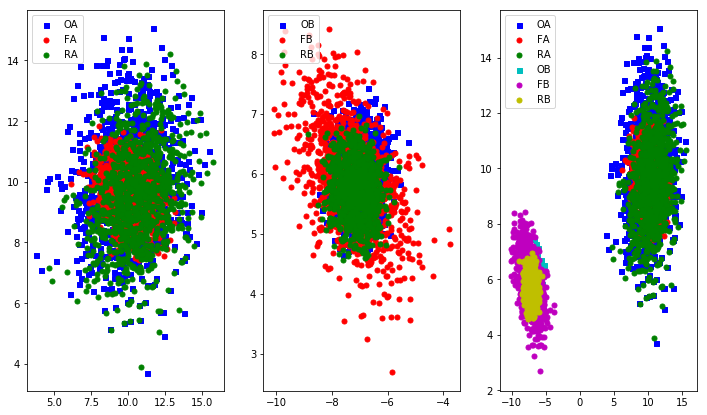

[Epoch 900/1000] [Batch 248/250] [D loss: 0.735187, acc:  43%] [Translation AB Dist: 0.469210 BA Dist: 3.946039 Min AB Dist: 0.295937 Max BA: 6.774674][G loss: 2.043538, adv: 0.643417, recon: 0.261049, id: 18.806501] time: 0:09:18.299301 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


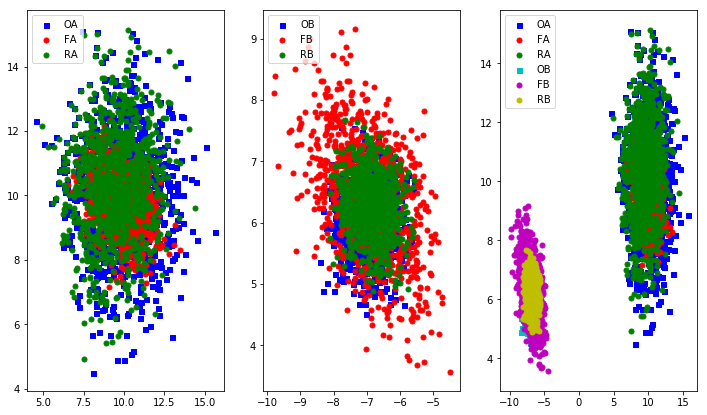

[Epoch 950/1000] [Batch 248/250] [D loss: 0.705185, acc:  56%] [Translation AB Dist: 0.568471 BA Dist: 4.010444 Min AB Dist: 0.447428 Max BA: 6.850737][G loss: 2.244953, adv: 0.705600, recon: 0.299936, id: 18.750790] time: 0:09:49.254605 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


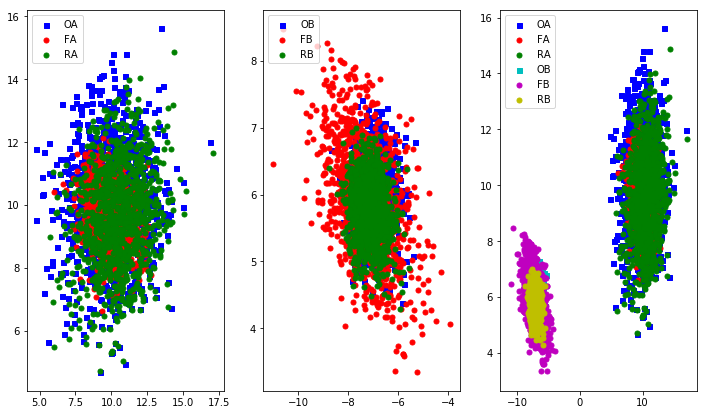

In [82]:
gan_default= CycleGAN(data_A, data_B)
gan_default.train(epochs=1000, batch_size=4, sample_interval=50)

Increased the capacity of the generator by increasing the width of the layers that already exist 

In [8]:
class WiderCycleGAN():
    def __init__(self, data_A, data_B, lr_G=0.001, lr_D=0.0005, lambda_cycle=1, 
                 disclossconst=1, idloss=0.01, disclossfunc='binary_crossentropy', width=4, seed=997):
        
        #
        self.data_shape=(2,)
        self.data_dim=2
        self.disclossconst=disclossconst
        self.idloss=idloss
        self.disclossfunc=disclossfunc
        self.seed=seed
        self.width=width

        # Loss weights
        ##################################
        # First change: set cycle-consistency weight to unit.
        # Could probably do the same to identity-loss weight
        # without much change, but the lambda_cycle weight
        # did seem to have an effect
        ##################################
        self.lambda_cycle = lambda_cycle                    # Cycle-consistency loss
        self.lambda_id = self.idloss * self.lambda_cycle    # Identity loss

        ##################################
        # Second change: optimizers
        # Start with SGD on easy data, then consider using Adam/RMSprop when you
        # get a feel for how training will go. The former is simpler and more
        # predictable, the latter can be erratic if you don't understand how to
        # set the hyperparameters.
        #
        # And then: different learning rates for generator and discriminator.
        # I'm suspicious of anyone who doesn't do this unless the discriminator
        # is non-sigmoid.
        # I'm suspicious of non-sigmoid discriminators except Wasserstein GAN.
        ##################################
        optimizer_G = SGD(lr=lr_G)
        optimizer_D = SGD(lr=lr_D)

        ##################################
        # Third change: discriminator loss
        # The original CycleGAN authors used MSE instead of BCE.
        # They cited some paper I've never heard of which claimed
        # that it encourages stability.
        # This sounds like a poor-man's Wasserstein GAN without
        # any of the analysis to back it up, FWIW.
        # Switched back to BCE because we know it works on
        # other types of GANs.
        #
        # ALSO: The discriminator's output layer had a sigmoid
        # activation, which doesn't make sense with MSE.
        # If you look in the original cyclegan.py, the
        # discriminator's final layer was the default activation,
        # which is linear. This makes more sense with MSE.
        # I also tried leaving MSE loss, and making the discriminator's
        # last activation linear, but that didn't work as well.
        ##################################
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])
        self.d_B.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------
        np.random.seed(self.seed)
        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input instances from both domains
        datum_A = Input(shape=self.data_shape)
        datum_B = Input(shape=self.data_shape)


        #Is this going to work the way I have it here
        #or should I be taking something from a batch?
        # Translate images to the other domain
        fake_B = self.g_AB(datum_A)
        fake_A = self.g_BA(datum_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        datum_A_id = self.g_BA(datum_A)
        datum_B_id = self.g_AB(datum_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        ##################################
        # Third change (part two): consistent switch to BCE
        # for all discriminator losses
        ##################################
        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[datum_A, datum_B],
                              outputs=[ valid_A, valid_B,
                                        reconstr_A, reconstr_B,
                                        datum_A_id, datum_B_id ])
        self.combined.compile(loss=[self.disclossfunc, self.disclossfunc,
                                    'mae', 'mae',
                                    'mae', 'mae'],
                            loss_weights=[  self.disclossconst, self.disclossconst,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id ],
                            optimizer=optimizer_G)

    

    def build_generator(self):
        """
        Simple MLP generator for the MoG unrolled GAN toy experiment
        """

        gen_input = Input(shape=(self.data_dim,), name="generator_input")

        ##################################
        # Fourth change: made this tanh instead of relu.
        # I suspect the important thing is to have similar activations
        # in generator and discriminator, but who knows.
        # Could also try relu in both, but I would use LeakyReLU.
        ##################################
        x = Dense(2*self.data_dim)(gen_input)
        x = Activation("tanh")(x)
     #     for i in range(2):
        x = Dense(self.width*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(2)(gen_input)
        

        generator_model = Model(inputs=[gen_input], outputs=[x])
        #visualize_model(generator_model)

        return generator_model

#        
    def build_discriminator(self):

        """
        Simple MLP discriminator for the MoG unrolled GAN toy experiment
        """

        disc_input = Input(shape=(2,), name="discriminator_input")

        x = Dense(2*self.data_dim)(disc_input)
        x = Activation("tanh")(x)
    #     for i in range(2):
        x = Dense(2*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(1, activation="sigmoid")(x)

        discriminator_model = Model(inputs=[disc_input], outputs=[x])
        #visualize_model(discriminator_model)

        #is there a difference between what this returns and the original cycelgan does?
        return discriminator_model

    
    def train(self, epochs, batch_size=1, sample_interval=50):

        start_time = datetime.datetime.now()
        np.random.seed(self.seed)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,)) #+ self.disc_patch)
        fake = np.zeros((batch_size,)) #+ self.disc_patch)
#         self.g_AB.summary()
#         self.g_BA.summary()
#         self.d_A.summary()
#         self.d_B.summary()
        self.n_batches = int(min(len(data_A), len(data_B)) / batch_size)
        #total_samples = self.n_batches * batch_size
        for epoch in range(epochs):
            for i in range(self.n_batches-1):
                #randomly shuffle data?
                
                #take the corresponding "Batch size" number of elements
                batch_A = data_A[i*batch_size:(i+1)*batch_size]
                batch_B = data_B[i*batch_size:(i+1)*batch_size]
                #put them through this thing
                
                
                # ----------------------
                #  Train Discriminators
                # ----------------------
               # print(imgs_A.shape)

                # Translate images to opposite domain
                fake_B = self.g_AB.predict(batch_A)
                fake_A = self.g_BA.predict(batch_B)
                #print(fake_A.shape)
                #print(fake_B.shape)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(batch_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(batch_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)


                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([batch_A, batch_B],
                                                        [valid, valid,
                                                        batch_A, batch_B,
                                                        batch_A, batch_B])

                elapsed_time = datetime.datetime.now() - start_time
                
                #question: when you call predict on a generator, does it return elements
                #in the same order you send them in?
                #because i'm assuming here that fake_a[i] will correspond to batch_b[i]. IS this true?
                #until I know, I'll stick to batch size 1 always
                translation_acc_AB=np.asarray([])
                translation_acc_BA=np.asarray([])
                translation_max_BA=np.asarray([])
                translation_min_AB=np.asarray([])
                #computes the average euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_acc_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()))
                translation_acc_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()))
                
                #computes the minimum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_min_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).min()))
                translation_min_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).min()))
                
                #computes the maximum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_max_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).max()))
                translation_max_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).max()))
    
                # Plot the progress
            if epoch % sample_interval == 0:
                print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] \n  [Translation AB Dist: %f BA Dist: %f Min AB Dist: %f Max AB: %f Min BA: %fMax BA: %f] \n [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                                                                        % ( epoch, epochs,
                                                                            i, self.n_batches,
                                                                            d_loss[0], 100*d_loss[1],
                                                                            np.asarray(translation_acc_AB).mean(),
                                                                            np.asarray(translation_acc_BA).mean(),
                                                                            np.asarray(translation_min_AB).mean(),
                                                                            np.asarray(translation_max_AB).mean(),
                                                                            np.asarray(translation_min_BA).mean(),
                                                                            np.asarray(translation_max_BA).mean(),
                                                                            g_loss[0], 
                                                                            np.mean(g_loss[1:3]),
                                                                            np.mean(g_loss[3:5]),
                                                                            np.mean(g_loss[5:6]),
                                                                            elapsed_time))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_data(epoch, i)

    def sample_data(self, epoch, batch_i):
       # r, c = 2, 3

        orig2, pic_data_A, pic_data_B= gen_data((10,10), 3, (-7,6), .25, 1000)
        
    
        # Translate images to the other domain
        fake_B = self.g_AB.predict(pic_data_A)
        fake_A = self.g_BA.predict(pic_data_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)
        
        #give the translation accuracy for a random element
        #I'm not doing the average because I'm not sure the fake and real correspond 1-1
        #I can change this later if I think they do
        num=np.random.randint(len(fake_A[0]))
        trans_acc_AB= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_A[num])), fake_B[num])])
        trans_acc_BA= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_B[num])), fake_A[num])])
#         translation_acc_AB.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(a)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()
#         translation_acc_BA.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(b)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()
    
        #print("[Trans Dist AB: %d Dist: %d]" \ %(trans_acc_AB, trans_acc_BA))
        
        
        #means and variances
        #(are vars computed right? I did it along one axis because I think they're the same on both) 
        #for real and generated distributions
        fakeA_mean=[np.mean(np.asarray(fake_A[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeA_var=np.asarray(fake_A[:,0]).var()
        realA_mean=[np.mean(np.asarray(pic_data_A[:,0])), np.mean(np.asarray(pic_data_A[:,1]))]
        realA_var=np.asarray(pic_data_A[:,0]).var()
        print("[Fake A Mean: (%d, %d) Fake A Var: %d A Mean: (%d, %d) A Var: %d ]"  
              %(fakeA_mean[0], fakeA_mean[1], fakeA_var, realA_mean[0], realA_mean[1], realA_var))
        
        fakeB_mean=[np.mean(np.asarray(fake_B[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeB_var=np.asarray(fake_B[:,0]).var()
        realB_mean=[np.mean(np.asarray(pic_data_B[:,0])), np.mean(np.asarray(pic_data_B[:,1]))]
        realB_var=np.asarray(pic_data_B[:,0]).var()
        print("[Fake B Mean: (%d, %d) Fake B Var: %d B Mean: (%d, %d) B Var: %d ]"  
              %(fakeB_mean[0], fakeB_mean[1], fakeB_var, realB_mean[0], realB_mean[1], realB_var))
        
        fig = plt.figure(figsize=(12,7))
        ax1 = fig.add_subplot(131)

        ax1.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax1.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax1.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        plt.legend(loc='upper left');
        
        ax2=fig.add_subplot(132)
        ax2.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='b', marker="s", label='OB')
        ax2.scatter(fake_B[:,0], fake_B[:,1], s=25, c='r', marker="o", label='FB')
        ax2.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='g', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        ax3=fig.add_subplot(133)
        ax3.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax3.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax3.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        ax3.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='c', marker="s", label='OB')
        ax3.scatter(fake_B[:,0], fake_B[:,1], s=25, c='m', marker="o", label='FB')
        ax3.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='y', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        plt.show()
        plt.clf()
        fig.savefig("images/%d_%d.png" % (epoch, batch_i))
        plt.close()

/home/emilybla/miniconda2/envs/py3keras/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/home/emilybla/miniconda2/envs/py3keras/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/home/emilybla/miniconda2/envs/py3keras/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


[Epoch 0/1000] [Batch 248/250] [D loss: 0.554533, acc:  68%] 
  [Translation AB Dist: 8.421287 BA Dist: 10.491321 Min AB Dist: 7.929031 Max AB: 8.961831 Min BA: 7.704925Max BA: 13.048357] 
 [G loss: 2.004217, adv: 0.709928, recon: 0.171418, id: 20.912828] time: 0:00:04.962536 
[Fake A Mean: (-2, 12) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-10, 12) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


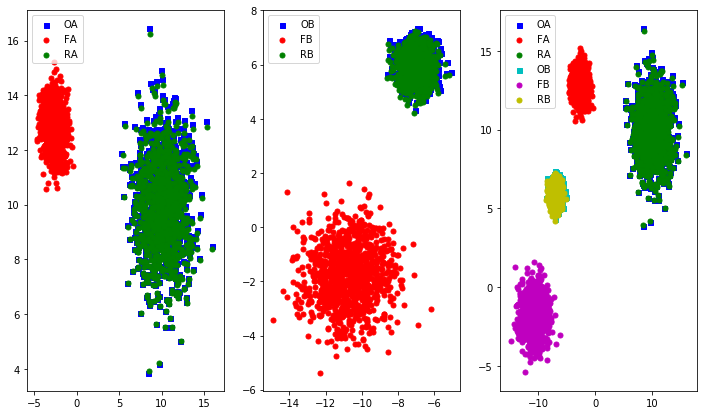

[Epoch 50/1000] [Batch 248/250] [D loss: 0.692294, acc:  56%] 
  [Translation AB Dist: 5.842555 BA Dist: 7.007076 Min AB Dist: 4.317066 Max AB: 6.811826 Min BA: 3.651621Max BA: 9.787028] 
 [G loss: 1.967321, adv: 0.697080, recon: 0.195058, id: 13.015862] time: 0:00:35.790998 
[Fake A Mean: (6, 6) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-11, 6) Fake B Var: 2 B Mean: (-7, 5) B Var: 0 ]


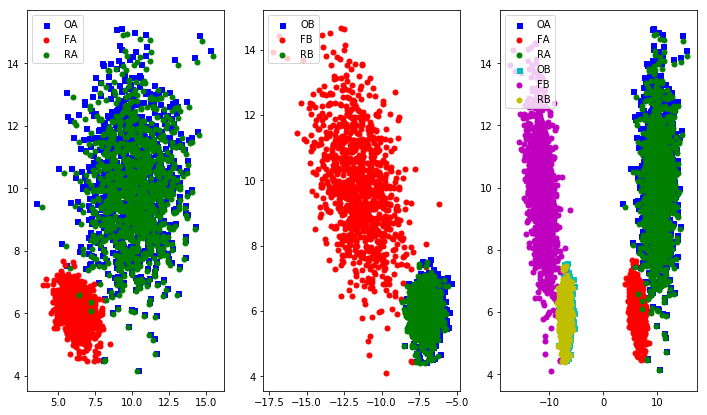

[Epoch 100/1000] [Batch 248/250] [D loss: 0.679868, acc:  68%] 
  [Translation AB Dist: 1.812630 BA Dist: 4.084772 Min AB Dist: 1.279515 Max AB: 2.297961 Min BA: 2.033003Max BA: 7.334306] 
 [G loss: 1.837406, adv: 0.693807, recon: 0.119733, id: 15.080724] time: 0:01:06.745141 
[Fake A Mean: (8, 8) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-8, 8) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


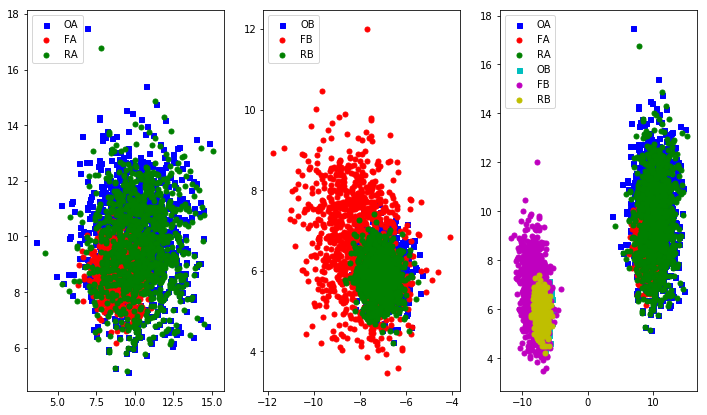

[Epoch 150/1000] [Batch 248/250] [D loss: 0.664705, acc:  56%] 
  [Translation AB Dist: 1.294356 BA Dist: 3.669497 Min AB Dist: 0.981471 Max AB: 1.410137 Min BA: 1.679353Max BA: 6.887064] 
 [G loss: 2.465510, adv: 0.728302, recon: 0.372751, id: 20.448845] time: 0:01:39.887938 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


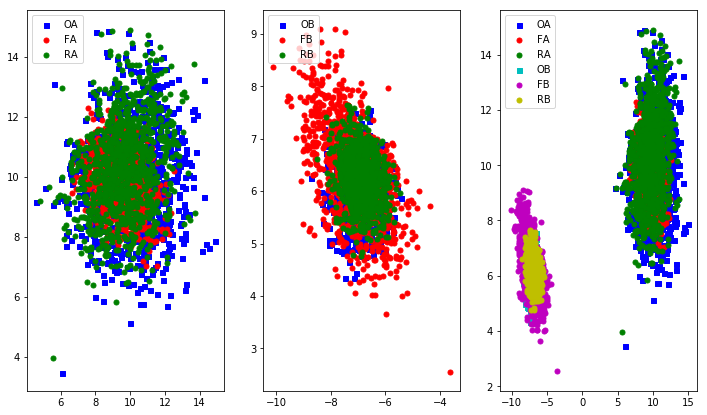

[Epoch 200/1000] [Batch 248/250] [D loss: 0.663563, acc:  62%] 
  [Translation AB Dist: 1.245865 BA Dist: 3.633823 Min AB Dist: 0.905853 Max AB: 1.449091 Min BA: 1.568153Max BA: 6.809453] 
 [G loss: 2.403998, adv: 0.733139, recon: 0.337938, id: 20.667515] time: 0:02:19.285193 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


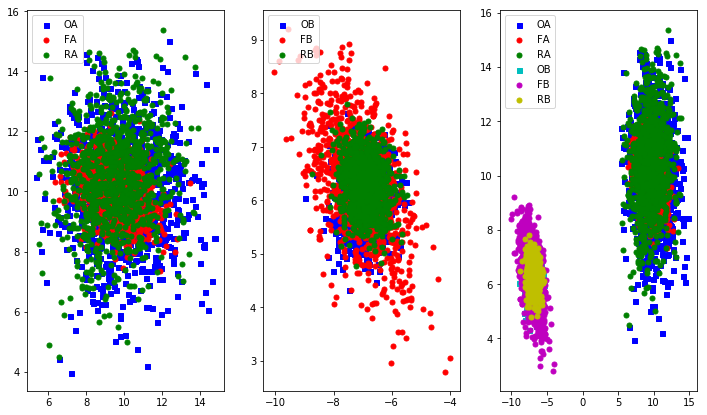

[Epoch 250/1000] [Batch 248/250] [D loss: 0.660544, acc:  62%] 
  [Translation AB Dist: 1.234061 BA Dist: 3.635686 Min AB Dist: 0.877429 Max AB: 1.477484 Min BA: 1.528115Max BA: 6.798716] 
 [G loss: 2.427391, adv: 0.742427, recon: 0.342917, id: 20.583000] time: 0:02:59.257092 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


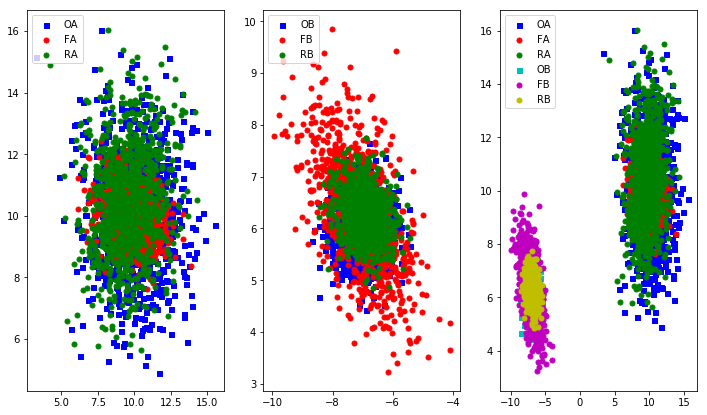

[Epoch 300/1000] [Batch 248/250] [D loss: 0.672093, acc:  62%] 
  [Translation AB Dist: 1.076777 BA Dist: 3.561013 Min AB Dist: 0.631457 Max AB: 1.437060 Min BA: 1.466520Max BA: 6.651154] 
 [G loss: 2.253767, adv: 0.721510, recon: 0.277688, id: 20.726143] time: 0:03:39.593674 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


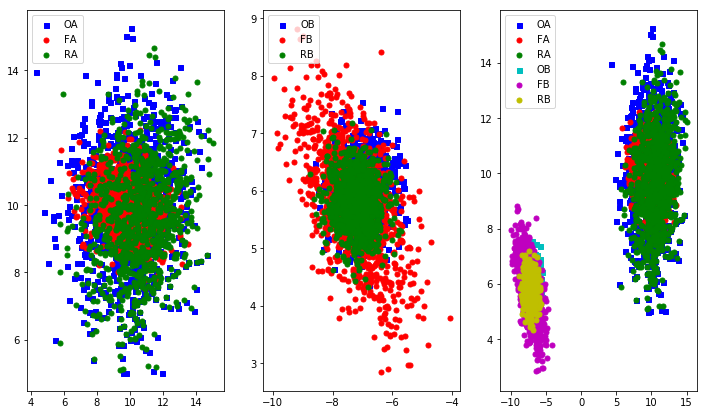

[Epoch 350/1000] [Batch 248/250] [D loss: 0.663022, acc:  62%] 
  [Translation AB Dist: 1.184333 BA Dist: 3.614853 Min AB Dist: 0.810285 Max AB: 1.490694 Min BA: 1.501361Max BA: 6.733939] 
 [G loss: 2.324824, adv: 0.741231, recon: 0.294083, id: 20.699707] time: 0:04:20.481938 
[Fake A Mean: (9, 10) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 10) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


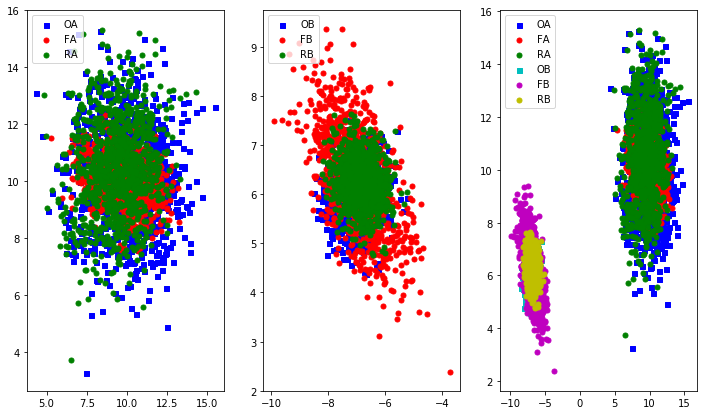

[Epoch 400/1000] [Batch 248/250] [D loss: 0.667212, acc:  68%] 
  [Translation AB Dist: 1.029464 BA Dist: 3.531255 Min AB Dist: 0.574013 Max AB: 1.436419 Min BA: 1.430085Max BA: 6.611310] 
 [G loss: 2.296952, adv: 0.738879, recon: 0.282804, id: 20.637436] time: 0:05:00.585729 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


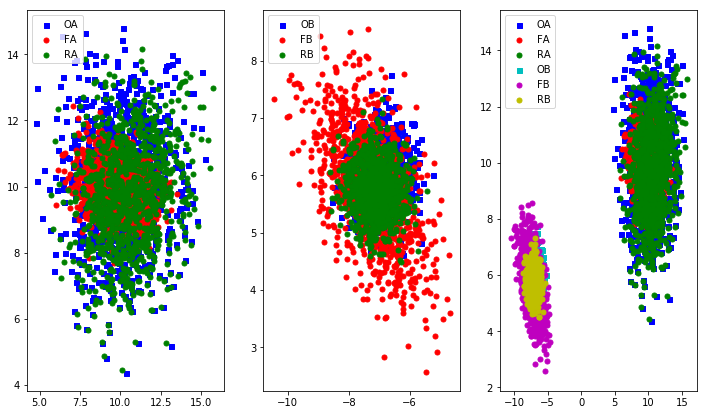

[Epoch 450/1000] [Batch 248/250] [D loss: 0.660416, acc:  68%] 
  [Translation AB Dist: 1.170291 BA Dist: 3.611344 Min AB Dist: 0.799435 Max AB: 1.467007 Min BA: 1.494517Max BA: 6.764313] 
 [G loss: 2.427073, adv: 0.752687, recon: 0.334089, id: 20.683216] time: 0:05:41.160703 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


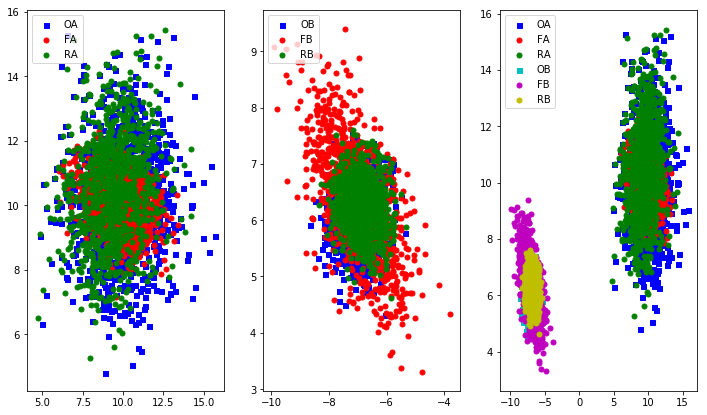

[Epoch 500/1000] [Batch 248/250] [D loss: 0.660109, acc:  68%] 
  [Translation AB Dist: 1.176037 BA Dist: 3.607462 Min AB Dist: 0.815611 Max AB: 1.477661 Min BA: 1.495695Max BA: 6.731134] 
 [G loss: 2.497559, adv: 0.765785, recon: 0.356620, id: 20.642616] time: 0:06:21.293869 
[Fake A Mean: (9, 10) Fake A Var: 1 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-6, 10) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


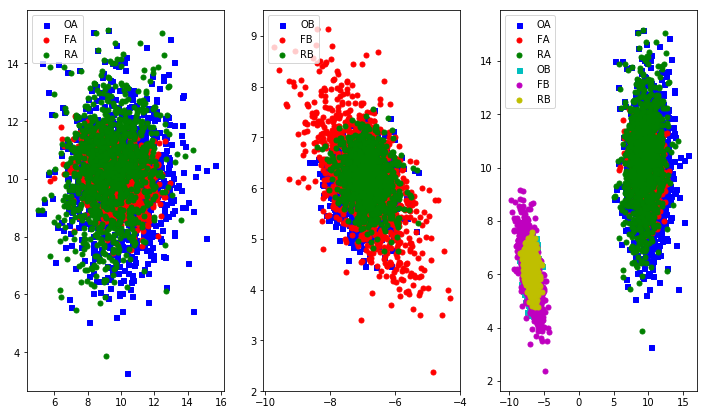

[Epoch 550/1000] [Batch 248/250] [D loss: 0.666999, acc:  68%] 
  [Translation AB Dist: 1.175858 BA Dist: 3.610953 Min AB Dist: 0.812304 Max AB: 1.457104 Min BA: 1.534420Max BA: 6.702095] 
 [G loss: 2.429717, adv: 0.775985, recon: 0.312652, id: 20.639694] time: 0:07:01.603520 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


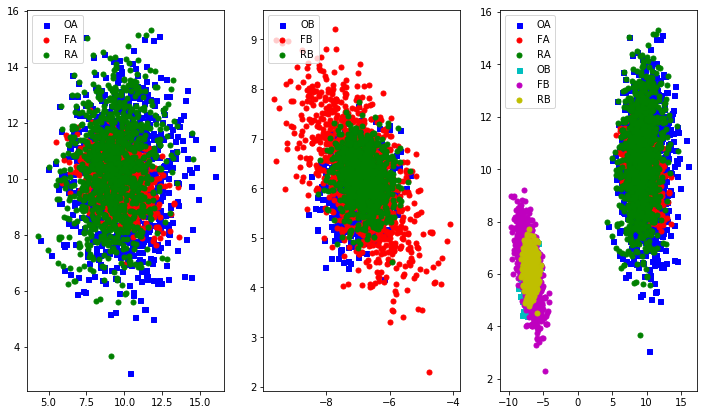

[Epoch 600/1000] [Batch 248/250] [D loss: 0.670558, acc:  68%] 
  [Translation AB Dist: 1.215519 BA Dist: 3.658474 Min AB Dist: 0.859556 Max AB: 1.410446 Min BA: 1.594132Max BA: 6.847464] 
 [G loss: 2.567028, adv: 0.770815, recon: 0.386109, id: 20.732201] time: 0:07:41.760972 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


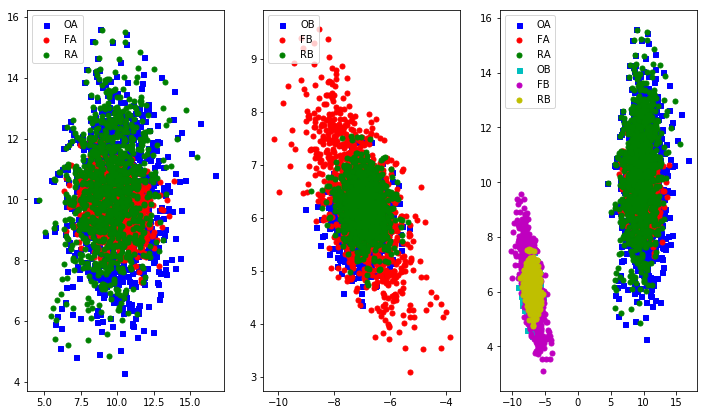

[Epoch 650/1000] [Batch 248/250] [D loss: 0.696292, acc:  62%] 
  [Translation AB Dist: 1.237096 BA Dist: 3.670854 Min AB Dist: 0.894151 Max AB: 1.412108 Min BA: 1.721444Max BA: 6.693195] 
 [G loss: 2.382945, adv: 0.766611, recon: 0.298112, id: 20.801504] time: 0:08:21.989765 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


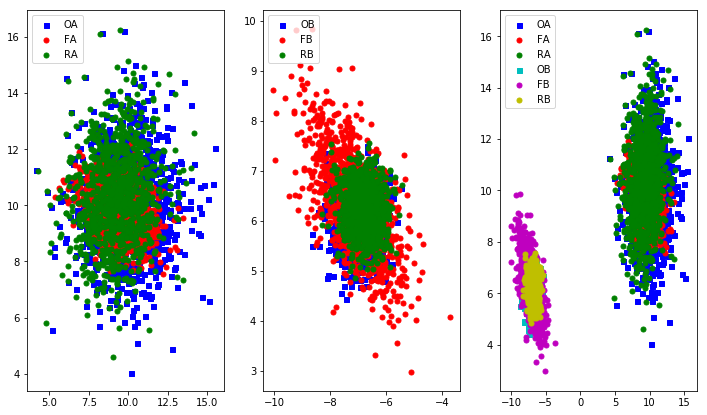

[Epoch 700/1000] [Batch 248/250] [D loss: 0.682649, acc:  56%] 
  [Translation AB Dist: 1.261351 BA Dist: 3.673098 Min AB Dist: 0.938730 Max AB: 1.442913 Min BA: 1.792308Max BA: 6.535298] 
 [G loss: 2.329664, adv: 0.749774, recon: 0.288825, id: 20.717827] time: 0:09:02.110303 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


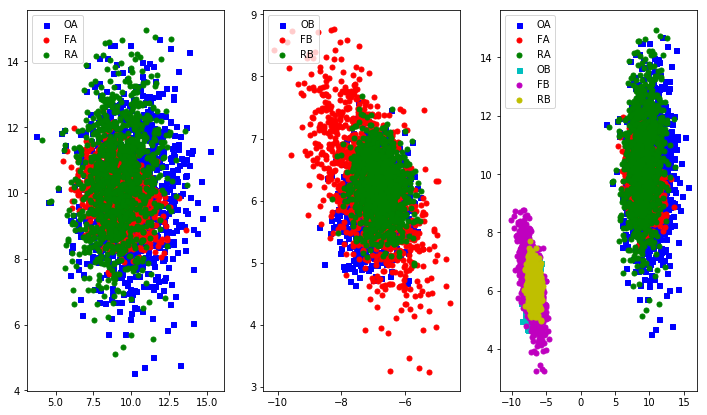

[Epoch 750/1000] [Batch 248/250] [D loss: 0.673486, acc:  62%] 
  [Translation AB Dist: 1.187670 BA Dist: 3.619960 Min AB Dist: 0.843320 Max AB: 1.446952 Min BA: 1.651908Max BA: 6.559503] 
 [G loss: 2.345832, adv: 0.771288, recon: 0.275053, id: 20.797325] time: 0:09:42.421088 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


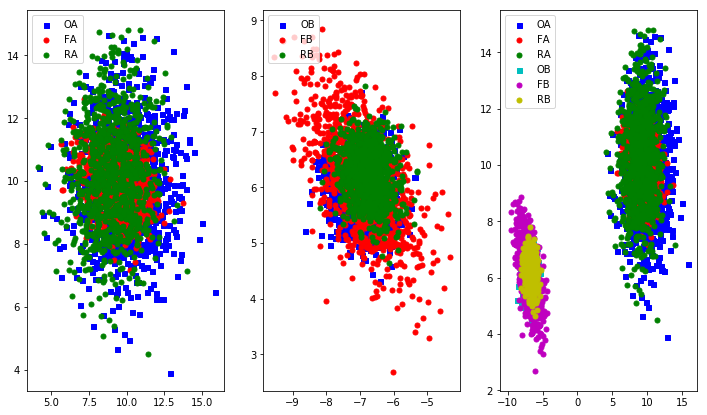

[Epoch 800/1000] [Batch 248/250] [D loss: 0.667488, acc:  62%] 
  [Translation AB Dist: 1.171952 BA Dist: 3.603532 Min AB Dist: 0.824349 Max AB: 1.437042 Min BA: 1.597990Max BA: 6.575830] 
 [G loss: 2.365555, adv: 0.774581, recon: 0.282159, id: 20.719896] time: 0:10:22.682566 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


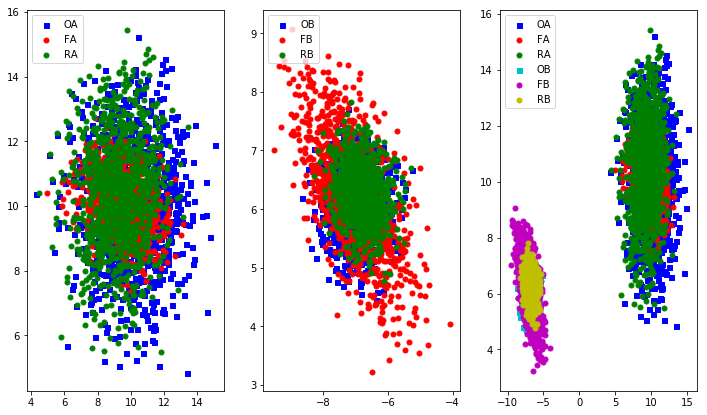

[Epoch 850/1000] [Batch 248/250] [D loss: 0.666171, acc:  68%] 
  [Translation AB Dist: 1.155345 BA Dist: 3.587857 Min AB Dist: 0.812219 Max AB: 1.430262 Min BA: 1.572916Max BA: 6.556126] 
 [G loss: 2.341909, adv: 0.766539, recon: 0.278724, id: 20.564392] time: 0:11:02.595127 
[Fake A Mean: (9, 10) Fake A Var: 1 A Mean: (10, 9) A Var: 3 ]
[Fake B Mean: (-6, 10) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


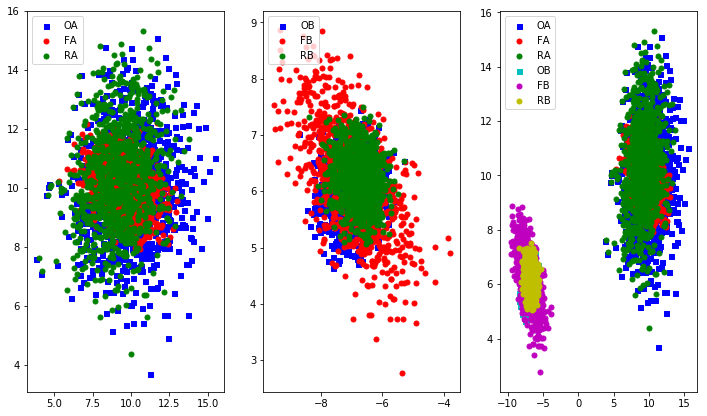

[Epoch 900/1000] [Batch 248/250] [D loss: 0.692466, acc:  62%] 
  [Translation AB Dist: 1.033095 BA Dist: 3.528589 Min AB Dist: 0.621280 Max AB: 1.368594 Min BA: 1.491470Max BA: 6.556030] 
 [G loss: 2.269975, adv: 0.742877, recon: 0.266842, id: 20.484980] time: 0:11:42.533174 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


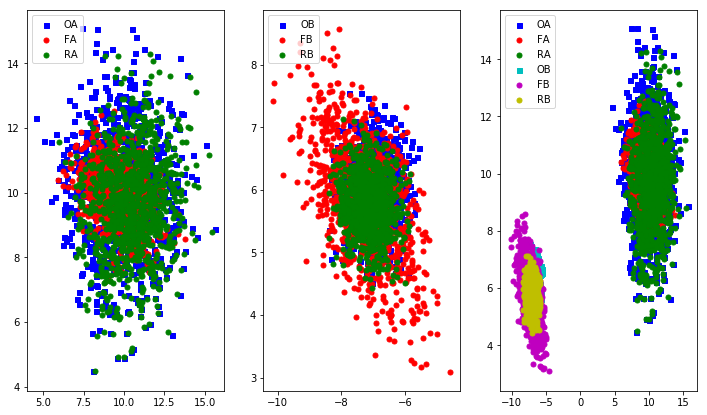

[Epoch 950/1000] [Batch 248/250] [D loss: 0.662436, acc:  62%] 
  [Translation AB Dist: 1.122592 BA Dist: 3.573052 Min AB Dist: 0.767231 Max AB: 1.435251 Min BA: 1.481107Max BA: 6.696262] 
 [G loss: 2.596437, adv: 0.795630, recon: 0.378285, id: 20.373886] time: 0:12:23.090513 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


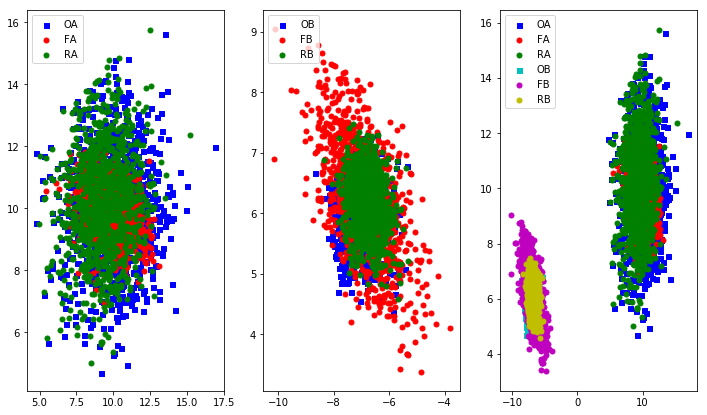

In [9]:
gan_4_width = WiderCycleGAN(data_A, data_B)
gan_4_width.train(epochs=1000, batch_size=4, sample_interval=50)

/home/emilybla/miniconda2/envs/py3keras/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


[Epoch 0/1000] [Batch 248/250] [D loss: 0.525213, acc:  75%] 
  [Translation AB Dist: 5.465964 BA Dist: 6.856022 Min AB Dist: 5.018732 Max AB: 5.973246 Min BA: 5.610703Max BA: 8.679764] 
 [G loss: 3.278950, adv: 1.342839, recon: 0.170989, id: 21.001148] time: 0:00:02.544485 
[Fake A Mean: (3, 12) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-8, 12) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


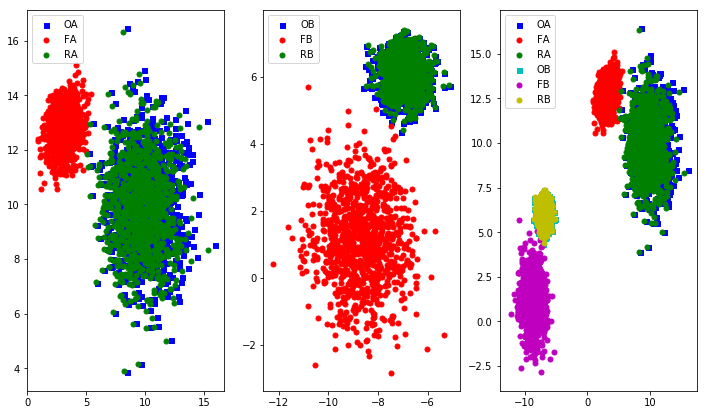

[Epoch 50/1000] [Batch 248/250] [D loss: 0.691292, acc:  68%] 
  [Translation AB Dist: 1.561364 BA Dist: 3.888578 Min AB Dist: 1.178250 Max AB: 1.988987 Min BA: 2.065545Max BA: 7.382200] 
 [G loss: 1.824748, adv: 0.699617, recon: 0.123360, id: 11.716331] time: 0:00:42.438669 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


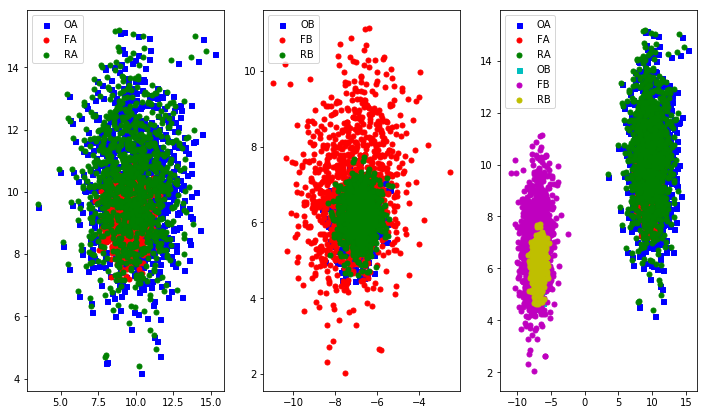

[Epoch 100/1000] [Batch 248/250] [D loss: 0.689666, acc:  56%] 
  [Translation AB Dist: 1.719800 BA Dist: 3.973923 Min AB Dist: 1.346136 Max AB: 2.199438 Min BA: 2.209168Max BA: 7.434289] 
 [G loss: 1.765261, adv: 0.706903, recon: 0.088142, id: 10.830005] time: 0:01:22.607399 
[Fake A Mean: (9, 8) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 8) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


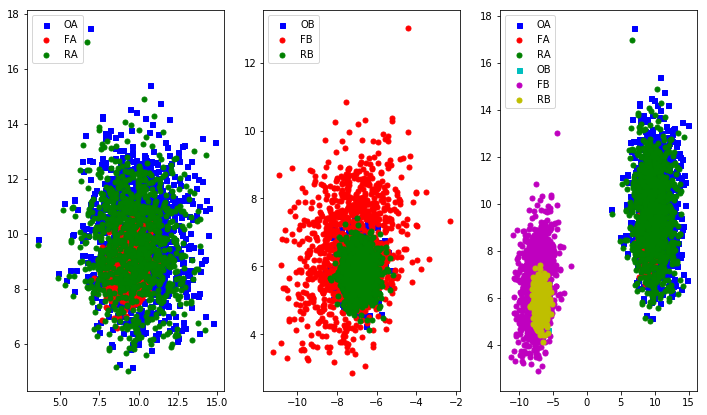

[Epoch 150/1000] [Batch 248/250] [D loss: 0.688487, acc:  56%] 
  [Translation AB Dist: 1.812135 BA Dist: 4.093484 Min AB Dist: 1.290091 Max AB: 2.278624 Min BA: 1.928783Max BA: 7.352075] 
 [G loss: 1.904609, adv: 0.706812, recon: 0.148157, id: 13.005860] time: 0:02:02.847989 
[Fake A Mean: (8, 8) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-8, 8) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


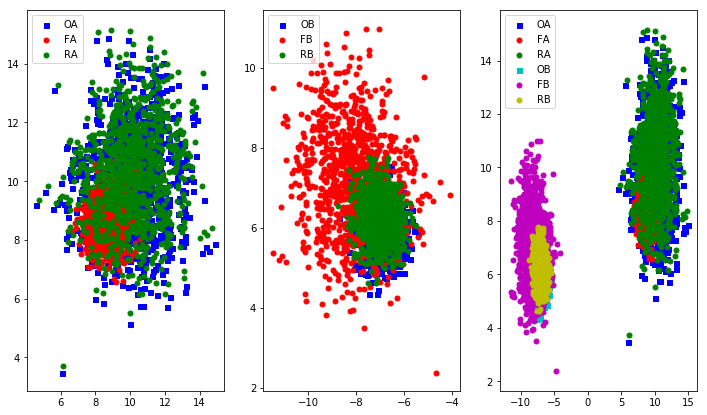

[Epoch 200/1000] [Batch 248/250] [D loss: 0.681872, acc:  56%] 
  [Translation AB Dist: 1.724939 BA Dist: 4.030585 Min AB Dist: 1.290394 Max AB: 2.123454 Min BA: 1.959043Max BA: 7.258708] 
 [G loss: 1.890022, adv: 0.717168, recon: 0.119398, id: 15.345549] time: 0:02:33.680697 
[Fake A Mean: (8, 8) Fake A Var: 0 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-8, 8) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


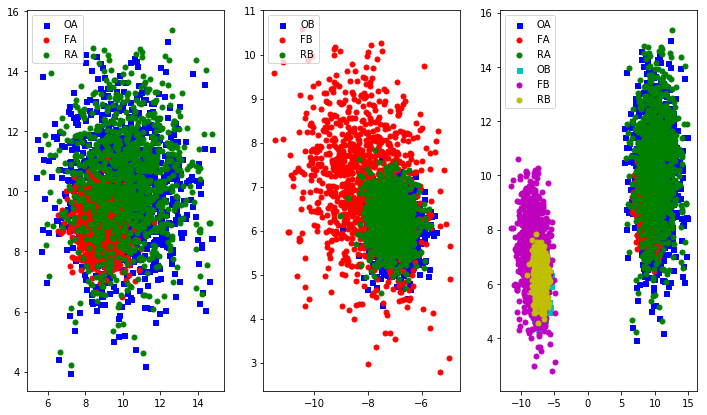

[Epoch 250/1000] [Batch 248/250] [D loss: 0.671905, acc:  62%] 
  [Translation AB Dist: 1.612393 BA Dist: 3.924757 Min AB Dist: 1.297754 Max AB: 1.906511 Min BA: 2.097083Max BA: 7.203016] 
 [G loss: 1.965076, adv: 0.733745, recon: 0.131911, id: 16.894794] time: 0:03:04.552780 
[Fake A Mean: (8, 9) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


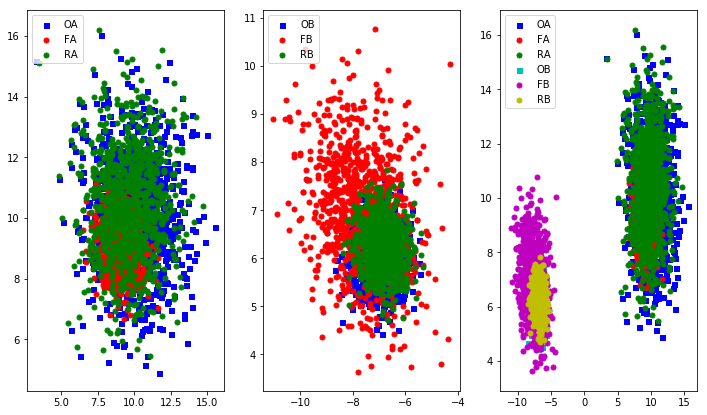

[Epoch 300/1000] [Batch 248/250] [D loss: 0.677105, acc:  56%] 
  [Translation AB Dist: 1.510189 BA Dist: 3.820432 Min AB Dist: 1.239479 Max AB: 1.828355 Min BA: 2.057195Max BA: 7.064129] 
 [G loss: 2.250269, adv: 0.723267, recon: 0.281333, id: 17.471176] time: 0:03:35.391693 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


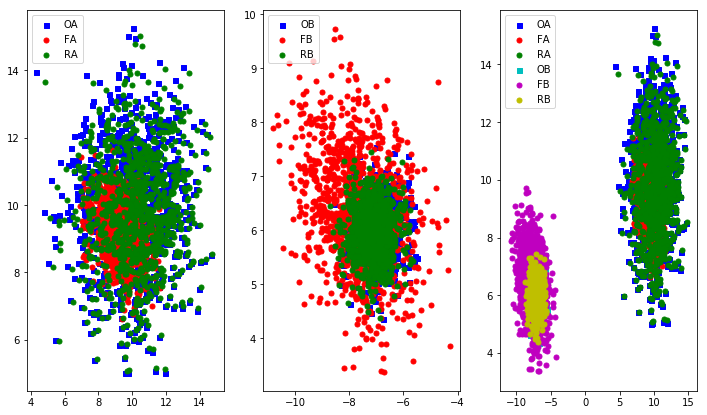

[Epoch 350/1000] [Batch 248/250] [D loss: 0.665434, acc:  56%] 
  [Translation AB Dist: 1.274085 BA Dist: 3.683280 Min AB Dist: 0.921708 Max AB: 1.451227 Min BA: 1.845996Max BA: 7.011036] 
 [G loss: 2.033241, adv: 0.748251, recon: 0.146859, id: 17.503559] time: 0:04:06.293457 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 6) B Var: 0 ]


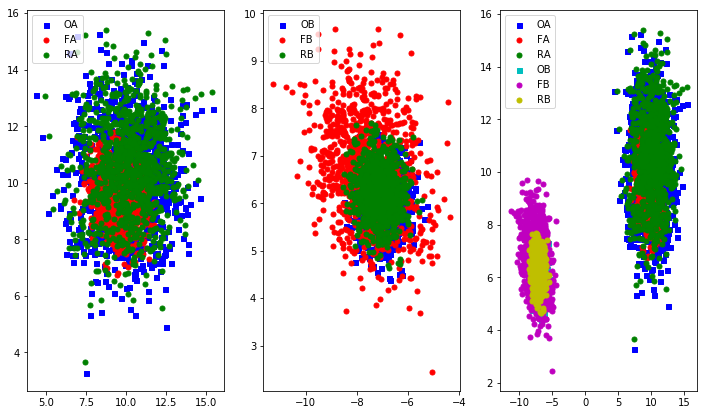

[Epoch 400/1000] [Batch 248/250] [D loss: 0.657282, acc:  56%] 
  [Translation AB Dist: 1.290605 BA Dist: 3.682923 Min AB Dist: 0.962187 Max AB: 1.464680 Min BA: 1.815983Max BA: 7.070345] 
 [G loss: 1.973938, adv: 0.770627, recon: 0.091925, id: 17.868164] time: 0:04:37.320575 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


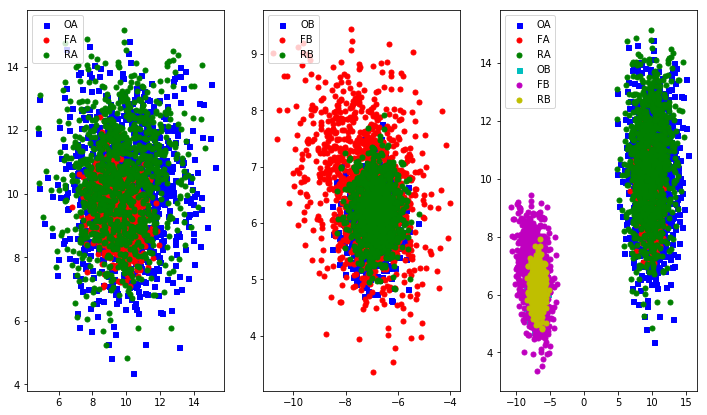

[Epoch 450/1000] [Batch 248/250] [D loss: 0.654730, acc:  56%] 
  [Translation AB Dist: 1.354162 BA Dist: 3.688780 Min AB Dist: 1.065148 Max AB: 1.566305 Min BA: 1.746829Max BA: 7.138150] 
 [G loss: 2.217331, adv: 0.784552, recon: 0.197474, id: 18.069805] time: 0:05:08.236130 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 6) B Var: 0 ]


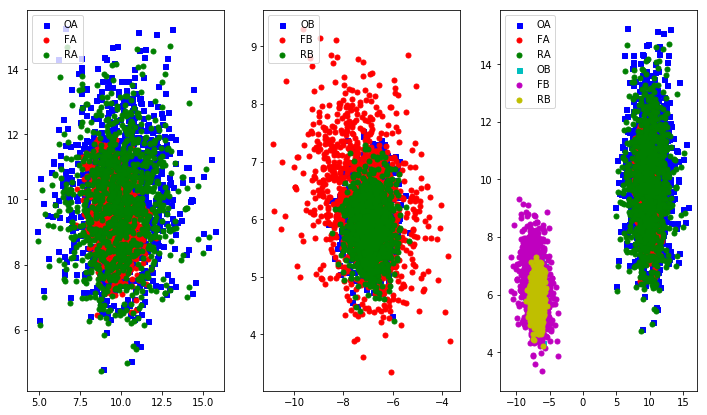

[Epoch 500/1000] [Batch 248/250] [D loss: 0.653339, acc:  56%] 
  [Translation AB Dist: 1.306852 BA Dist: 3.660352 Min AB Dist: 0.992362 Max AB: 1.483363 Min BA: 1.762870Max BA: 7.090818] 
 [G loss: 2.457157, adv: 0.800283, recon: 0.299799, id: 18.181406] time: 0:05:39.020402 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 6) B Var: 0 ]


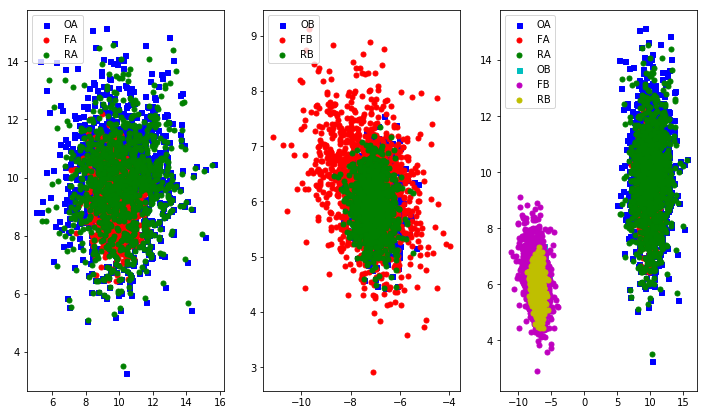

[Epoch 550/1000] [Batch 248/250] [D loss: 0.648749, acc:  56%] 
  [Translation AB Dist: 1.250762 BA Dist: 3.634420 Min AB Dist: 0.947639 Max AB: 1.493409 Min BA: 1.750593Max BA: 7.113633] 
 [G loss: 2.130642, adv: 0.820754, recon: 0.113640, id: 18.433245] time: 0:06:09.992145 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


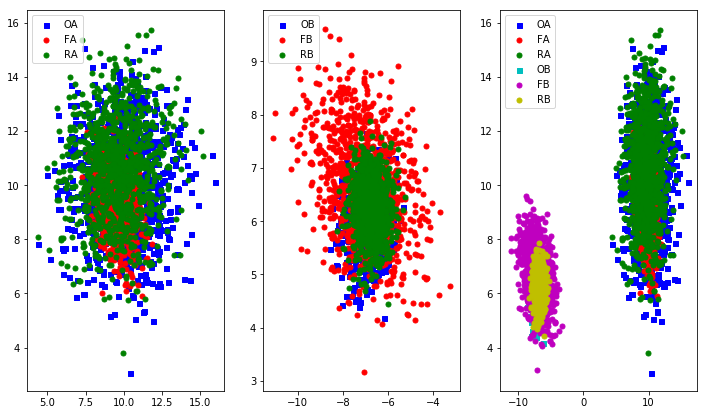

[Epoch 600/1000] [Batch 248/250] [D loss: 0.648715, acc:  56%] 
  [Translation AB Dist: 1.164481 BA Dist: 3.574895 Min AB Dist: 0.816421 Max AB: 1.387493 Min BA: 1.657466Max BA: 7.098691] 
 [G loss: 2.197896, adv: 0.827607, recon: 0.137858, id: 18.729261] time: 0:06:40.903197 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-6, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


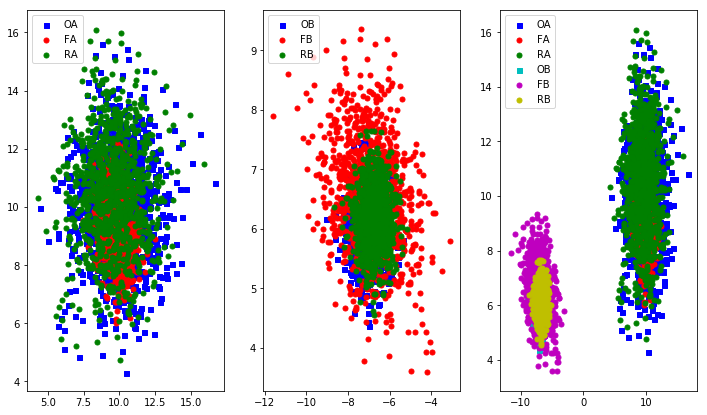

[Epoch 650/1000] [Batch 248/250] [D loss: 0.647441, acc:  56%] 
  [Translation AB Dist: 1.214547 BA Dist: 3.592721 Min AB Dist: 0.920334 Max AB: 1.524625 Min BA: 1.694360Max BA: 7.125429] 
 [G loss: 2.397753, adv: 0.838804, recon: 0.225961, id: 18.562710] time: 0:07:11.847188 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


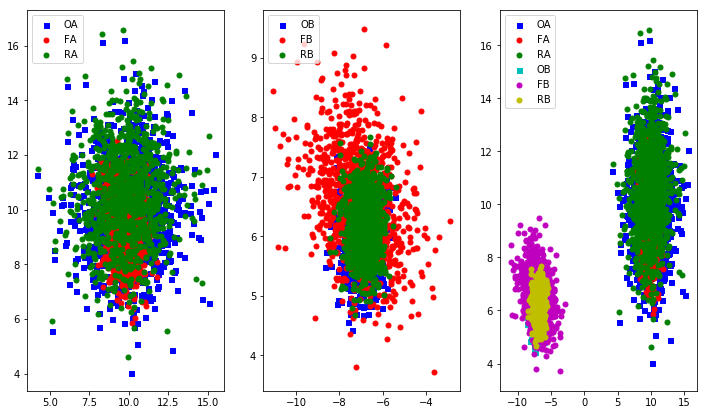

[Epoch 700/1000] [Batch 248/250] [D loss: 0.647049, acc:  56%] 
  [Translation AB Dist: 1.144495 BA Dist: 3.543267 Min AB Dist: 0.813776 Max AB: 1.435933 Min BA: 1.636640Max BA: 7.088083] 
 [G loss: 2.322649, adv: 0.842940, recon: 0.182841, id: 18.584553] time: 0:07:42.771304 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 10) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


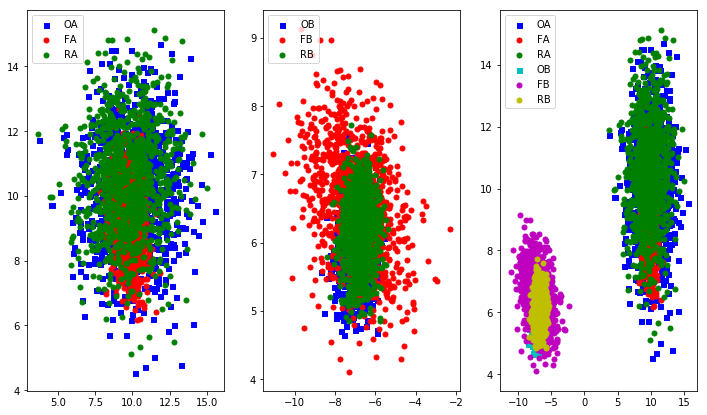

[Epoch 750/1000] [Batch 248/250] [D loss: 0.648221, acc:  56%] 
  [Translation AB Dist: 1.126027 BA Dist: 3.538549 Min AB Dist: 0.782899 Max AB: 1.400672 Min BA: 1.711951Max BA: 7.037883] 
 [G loss: 2.385650, adv: 0.845634, recon: 0.210184, id: 18.710098] time: 0:08:13.671946 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 9) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


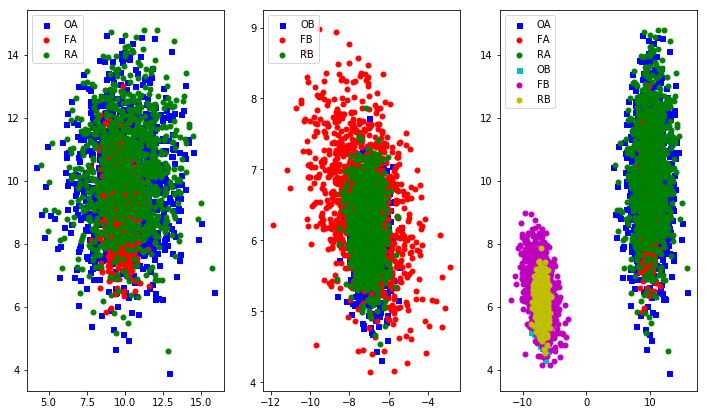

[Epoch 800/1000] [Batch 248/250] [D loss: 0.649519, acc:  56%] 
  [Translation AB Dist: 1.255826 BA Dist: 3.602875 Min AB Dist: 0.992760 Max AB: 1.625804 Min BA: 1.786529Max BA: 7.114108] 
 [G loss: 2.200056, adv: 0.844286, recon: 0.117668, id: 18.855469] time: 0:08:44.473256 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


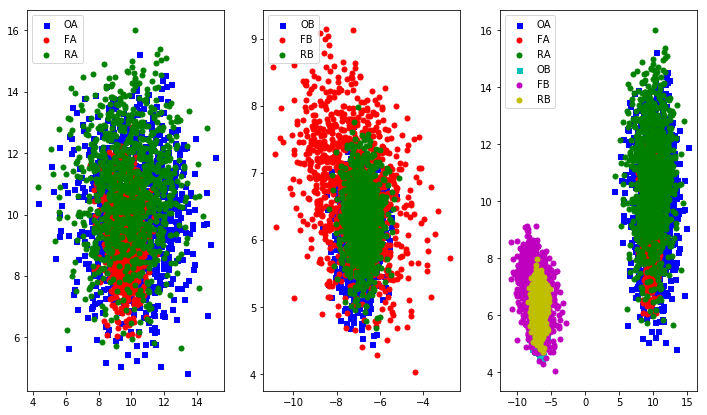

[Epoch 850/1000] [Batch 248/250] [D loss: 0.650542, acc:  56%] 
  [Translation AB Dist: 1.181796 BA Dist: 3.556195 Min AB Dist: 0.875185 Max AB: 1.515743 Min BA: 1.699729Max BA: 7.101362] 
 [G loss: 2.226073, adv: 0.843129, recon: 0.131331, id: 18.863827] time: 0:09:15.390354 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


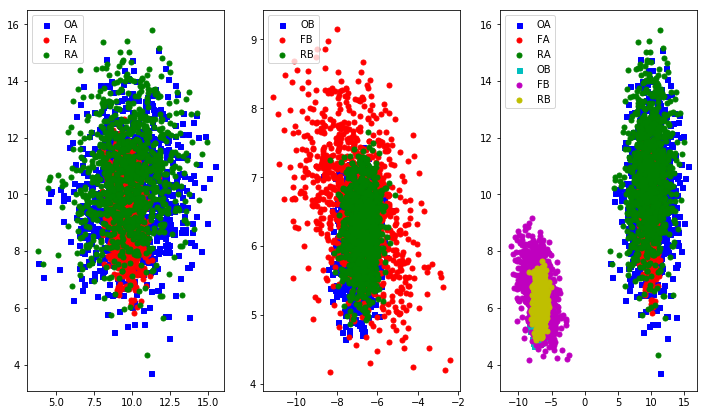

[Epoch 900/1000] [Batch 248/250] [D loss: 0.651874, acc:  56%] 
  [Translation AB Dist: 1.258913 BA Dist: 3.584673 Min AB Dist: 0.954595 Max AB: 1.484658 Min BA: 1.729102Max BA: 7.100059] 
 [G loss: 2.542497, adv: 0.836522, recon: 0.296194, id: 18.805664] time: 0:09:46.288069 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 6) B Var: 0 ]


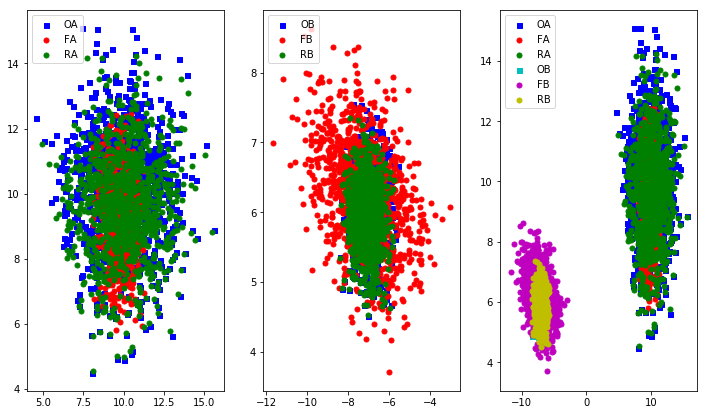

[Epoch 950/1000] [Batch 248/250] [D loss: 0.648962, acc:  56%] 
  [Translation AB Dist: 1.157345 BA Dist: 3.533251 Min AB Dist: 0.851706 Max AB: 1.497656 Min BA: 1.670049Max BA: 7.056333] 
 [G loss: 2.258913, adv: 0.837652, recon: 0.153127, id: 18.890312] time: 0:10:17.418438 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


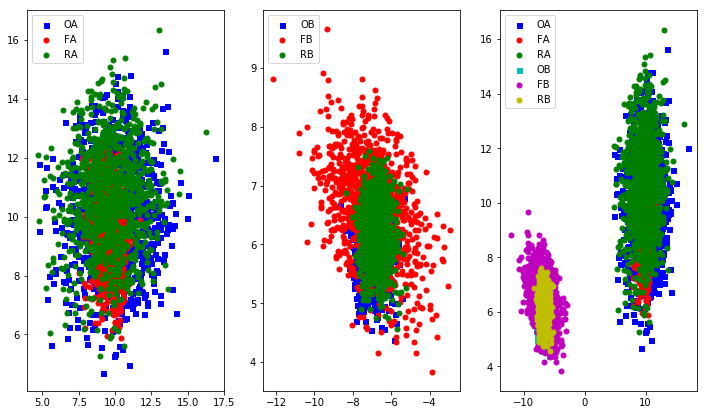

In [10]:
gan_8_width = WiderCycleGAN(data_A, data_B, width=8)
gan_8_width.train(epochs=1000, batch_size=4, sample_interval=50)

Increased the capacity of the generator by making it deeper

In [11]:
class DeeperCycleGAN():
    def __init__(self, data_A, data_B, lr_G=0.001, lr_D=0.0005, lambda_cycle=1, 
                 disclossconst=1, idloss=0.01, disclossfunc='binary_crossentropy', seed=997):
        
        #
        self.data_shape=(2,)
        self.data_dim=2
        self.disclossconst=disclossconst
        self.idloss=idloss
        self.disclossfunc=disclossfunc
        self.seed=seed

        # Loss weights
        ##################################
        # First change: set cycle-consistency weight to unit.
        # Could probably do the same to identity-loss weight
        # without much change, but the lambda_cycle weight
        # did seem to have an effect
        ##################################
        self.lambda_cycle = lambda_cycle                    # Cycle-consistency loss
        self.lambda_id = self.idloss * self.lambda_cycle    # Identity loss

        ##################################
        # Second change: optimizers
        # Start with SGD on easy data, then consider using Adam/RMSprop when you
        # get a feel for how training will go. The former is simpler and more
        # predictable, the latter can be erratic if you don't understand how to
        # set the hyperparameters.
        #
        # And then: different learning rates for generator and discriminator.
        # I'm suspicious of anyone who doesn't do this unless the discriminator
        # is non-sigmoid.
        # I'm suspicious of non-sigmoid discriminators except Wasserstein GAN.
        ##################################
        optimizer_G = SGD(lr=lr_G)
        optimizer_D = SGD(lr=lr_D)

        ##################################
        # Third change: discriminator loss
        # The original CycleGAN authors used MSE instead of BCE.
        # They cited some paper I've never heard of which claimed
        # that it encourages stability.
        # This sounds like a poor-man's Wasserstein GAN without
        # any of the analysis to back it up, FWIW.
        # Switched back to BCE because we know it works on
        # other types of GANs.
        #
        # ALSO: The discriminator's output layer had a sigmoid
        # activation, which doesn't make sense with MSE.
        # If you look in the original cyclegan.py, the
        # discriminator's final layer was the default activation,
        # which is linear. This makes more sense with MSE.
        # I also tried leaving MSE loss, and making the discriminator's
        # last activation linear, but that didn't work as well.
        ##################################
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])
        self.d_B.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------
        np.random.seed(self.seed)
        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input instances from both domains
        datum_A = Input(shape=self.data_shape)
        datum_B = Input(shape=self.data_shape)


        #Is this going to work the way I have it here
        #or should I be taking something from a batch?
        # Translate images to the other domain
        fake_B = self.g_AB(datum_A)
        fake_A = self.g_BA(datum_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        datum_A_id = self.g_BA(datum_A)
        datum_B_id = self.g_AB(datum_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        ##################################
        # Third change (part two): consistent switch to BCE
        # for all discriminator losses
        ##################################
        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[datum_A, datum_B],
                              outputs=[ valid_A, valid_B,
                                        reconstr_A, reconstr_B,
                                        datum_A_id, datum_B_id ])
        self.combined.compile(loss=[self.disclossfunc, self.disclossfunc,
                                    'mae', 'mae',
                                    'mae', 'mae'],
                            loss_weights=[  self.disclossconst, self.disclossconst,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id ],
                            optimizer=optimizer_G)

    

    def build_generator(self):
        """
        Simple MLP generator for the MoG unrolled GAN toy experiment
        """

        gen_input = Input(shape=(self.data_dim,), name="generator_input")

        ##################################
        # Fourth change: made this tanh instead of relu.
        # I suspect the important thing is to have similar activations
        # in generator and discriminator, but who knows.
        # Could also try relu in both, but I would use LeakyReLU.
        ##################################
        x = Dense(2*self.data_dim)(gen_input)
        x = Activation("tanh")(x)
     #     for i in range(2):
        x = Dense(4*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(4*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(2)(gen_input)
        

        generator_model = Model(inputs=[gen_input], outputs=[x])
        #visualize_model(generator_model)

        return generator_model

#        
    def build_discriminator(self):

        """
        Simple MLP discriminator for the MoG unrolled GAN toy experiment
        """

        disc_input = Input(shape=(2,), name="discriminator_input")

        x = Dense(2*self.data_dim)(disc_input)
        x = Activation("tanh")(x)
    #     for i in range(2):
        x = Dense(2*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(1, activation="sigmoid")(x)

        discriminator_model = Model(inputs=[disc_input], outputs=[x])
        #visualize_model(discriminator_model)

        #is there a difference between what this returns and the original cycelgan does?
        return discriminator_model

    
    def train(self, epochs, batch_size=1, sample_interval=50):

        start_time = datetime.datetime.now()
        np.random.seed(self.seed)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,)) #+ self.disc_patch)
        fake = np.zeros((batch_size,)) #+ self.disc_patch)
#         self.g_AB.summary()
#         self.g_BA.summary()
#         self.d_A.summary()
#         self.d_B.summary()
        self.n_batches = int(min(len(data_A), len(data_B)) / batch_size)
        #total_samples = self.n_batches * batch_size
        for epoch in range(epochs):
            for i in range(self.n_batches-1):
                #randomly shuffle data?
                
                #take the corresponding "Batch size" number of elements
                batch_A = data_A[i*batch_size:(i+1)*batch_size]
                batch_B = data_B[i*batch_size:(i+1)*batch_size]
                #put them through this thing
                
                
                # ----------------------
                #  Train Discriminators
                # ----------------------
               # print(imgs_A.shape)

                # Translate images to opposite domain
                fake_B = self.g_AB.predict(batch_A)
                fake_A = self.g_BA.predict(batch_B)
                #print(fake_A.shape)
                #print(fake_B.shape)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(batch_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(batch_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)


                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([batch_A, batch_B],
                                                        [valid, valid,
                                                        batch_A, batch_B,
                                                        batch_A, batch_B])

                elapsed_time = datetime.datetime.now() - start_time
                
                #question: when you call predict on a generator, does it return elements
                #in the same order you send them in?
                #because i'm assuming here that fake_a[i] will correspond to batch_b[i]. IS this true?
                #until I know, I'll stick to batch size 1 always
                translation_acc_AB=np.asarray([])
                translation_acc_BA=np.asarray([])
                translation_max_BA=np.asarray([])
                translation_min_AB=np.asarray([])
                #computes the average euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_acc_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()))
                translation_acc_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()))
                
                #computes the minimum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_min_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).min()))
                translation_min_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).min()))
                
                #computes the maximum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_max_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).max()))
                translation_max_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).max()))
    
                # Plot the progress
            if epoch % sample_interval == 0:
                print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] \n  [Translation AB Dist: %f BA Dist: %f Min AB Dist: %f Max AB: %f Min BA: %fMax BA: %f] \n [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                                                                        % ( epoch, epochs,
                                                                            i, self.n_batches,
                                                                            d_loss[0], 100*d_loss[1],
                                                                            np.asarray(translation_acc_AB).mean(),
                                                                            np.asarray(translation_acc_BA).mean(),
                                                                            np.asarray(translation_min_AB).mean(),
                                                                            np.asarray(translation_max_AB).mean(),
                                                                            np.asarray(translation_min_BA).mean(),
                                                                            np.asarray(translation_max_BA).mean(),
                                                                            g_loss[0], 
                                                                            np.mean(g_loss[1:3]),
                                                                            np.mean(g_loss[3:5]),
                                                                            np.mean(g_loss[5:6]),
                                                                            elapsed_time))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_data(epoch, i)

    def sample_data(self, epoch, batch_i):
       # r, c = 2, 3

        orig2, pic_data_A, pic_data_B= gen_data((10,10), 3, (-7,6), .25, 1000)
        
    
        # Translate images to the other domain
        fake_B = self.g_AB.predict(pic_data_A)
        fake_A = self.g_BA.predict(pic_data_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)
        
        #give the translation accuracy for a random element
        #I'm not doing the average because I'm not sure the fake and real correspond 1-1
        #I can change this later if I think they do
        num=np.random.randint(len(fake_A[0]))
        trans_acc_AB= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_A[num])), fake_B[num])])
        trans_acc_BA= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_B[num])), fake_A[num])])
#         translation_acc_AB.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(a)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()
#         translation_acc_BA.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(b)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()
    
        #print("[Trans Dist AB: %d Dist: %d]" \ %(trans_acc_AB, trans_acc_BA))
        
        
        #means and variances
        #(are vars computed right? I did it along one axis because I think they're the same on both) 
        #for real and generated distributions
        fakeA_mean=[np.mean(np.asarray(fake_A[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeA_var=np.asarray(fake_A[:,0]).var()
        realA_mean=[np.mean(np.asarray(pic_data_A[:,0])), np.mean(np.asarray(pic_data_A[:,1]))]
        realA_var=np.asarray(pic_data_A[:,0]).var()
        print("[Fake A Mean: (%d, %d) Fake A Var: %d A Mean: (%d, %d) A Var: %d ]"  
              %(fakeA_mean[0], fakeA_mean[1], fakeA_var, realA_mean[0], realA_mean[1], realA_var))
        
        fakeB_mean=[np.mean(np.asarray(fake_B[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeB_var=np.asarray(fake_B[:,0]).var()
        realB_mean=[np.mean(np.asarray(pic_data_B[:,0])), np.mean(np.asarray(pic_data_B[:,1]))]
        realB_var=np.asarray(pic_data_B[:,0]).var()
        print("[Fake B Mean: (%d, %d) Fake B Var: %d B Mean: (%d, %d) B Var: %d ]"  
              %(fakeB_mean[0], fakeB_mean[1], fakeB_var, realB_mean[0], realB_mean[1], realB_var))
        
        fig = plt.figure(figsize=(12,7))
        ax1 = fig.add_subplot(131)

        ax1.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax1.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax1.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        plt.legend(loc='upper left');
        
        ax2=fig.add_subplot(132)
        ax2.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='b', marker="s", label='OB')
        ax2.scatter(fake_B[:,0], fake_B[:,1], s=25, c='r', marker="o", label='FB')
        ax2.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='g', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        ax3=fig.add_subplot(133)
        ax3.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax3.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax3.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        ax3.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='c', marker="s", label='OB')
        ax3.scatter(fake_B[:,0], fake_B[:,1], s=25, c='m', marker="o", label='FB')
        ax3.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='y', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        plt.show()
        plt.clf()
        fig.savefig("images/%d_%d.png" % (epoch, batch_i))
        plt.close()

[Epoch 0/1000] [Batch 248/250] [D loss: 0.473954, acc:  75%] 
  [Translation AB Dist: 22.477020 BA Dist: 22.521057 Min AB Dist: 20.996271 Max AB: 23.232471 Min BA: 19.324289Max BA: 24.696115] 
 [G loss: 6.666356, adv: 1.562729, recon: 1.650475, id: 16.141001] time: 0:00:02.192945 
[Fake A Mean: (-2, -6) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (0, -6) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


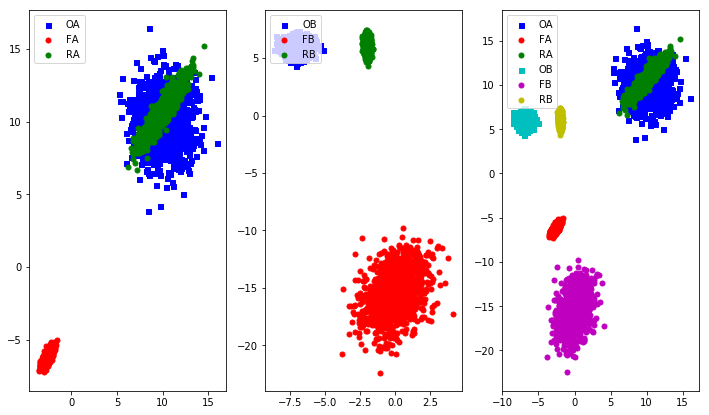

[Epoch 50/1000] [Batch 248/250] [D loss: 0.020919, acc: 100%] 
  [Translation AB Dist: 23.847353 BA Dist: 24.179118 Min AB Dist: 22.364547 Max AB: 24.718600 Min BA: 21.217178Max BA: 25.993939] 
 [G loss: 8.150168, adv: 3.847005, recon: 0.140623, id: 10.318816] time: 0:00:33.102436 
[Fake A Mean: (-5, -6) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (9, -6) Fake B Var: 3 B Mean: (-7, 5) B Var: 0 ]


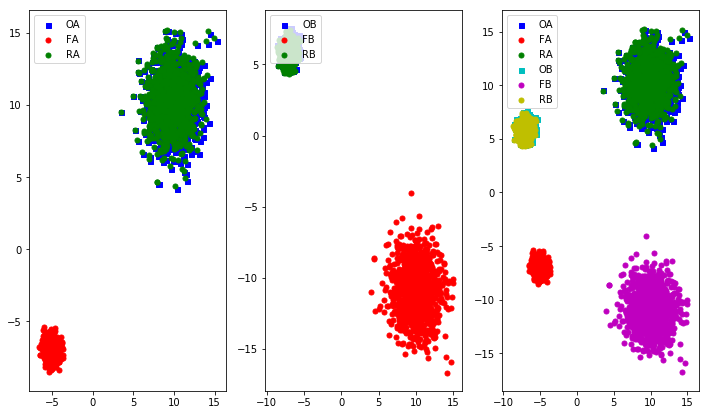

[Epoch 100/1000] [Batch 248/250] [D loss: 0.693390, acc:  31%] 
  [Translation AB Dist: 4.256611 BA Dist: 5.655434 Min AB Dist: 2.732644 Max AB: 5.743682 Min BA: 2.376831Max BA: 9.199028] 
 [G loss: 1.826781, adv: 0.695284, recon: 0.135687, id: 9.259383] time: 0:01:03.896219 
[Fake A Mean: (7, 6) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-10, 6) Fake B Var: 5 B Mean: (-7, 5) B Var: 0 ]


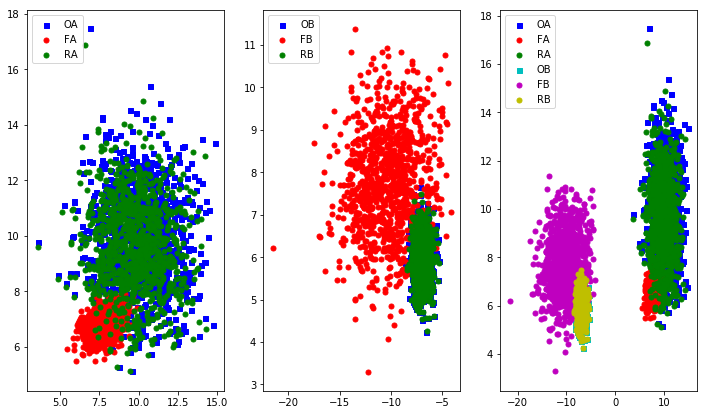

[Epoch 150/1000] [Batch 248/250] [D loss: 0.695382, acc:  37%] 
  [Translation AB Dist: 1.744594 BA Dist: 3.878676 Min AB Dist: 1.171890 Max AB: 2.426036 Min BA: 1.893081Max BA: 7.468055] 
 [G loss: 1.832172, adv: 0.704479, recon: 0.131080, id: 8.991543] time: 0:01:34.828854 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 3 B Mean: (-6, 5) B Var: 0 ]


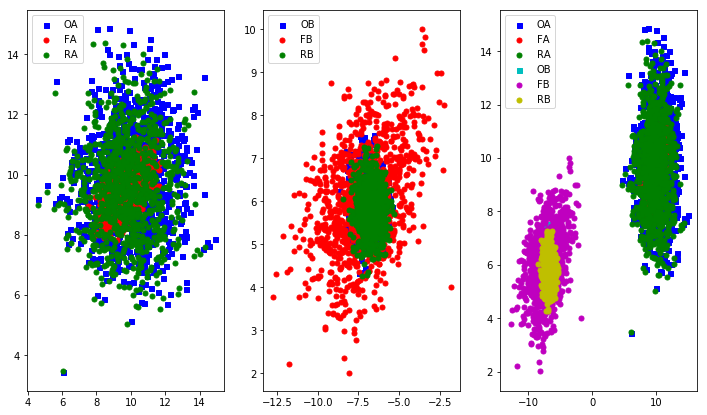

[Epoch 200/1000] [Batch 248/250] [D loss: 0.702143, acc:  31%] 
  [Translation AB Dist: 1.156359 BA Dist: 3.603239 Min AB Dist: 0.672360 Max AB: 1.547065 Min BA: 1.495680Max BA: 7.414016] 
 [G loss: 1.987358, adv: 0.690536, recon: 0.191282, id: 16.109474] time: 0:02:05.749924 
[Fake A Mean: (10, 9) Fake A Var: 0 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


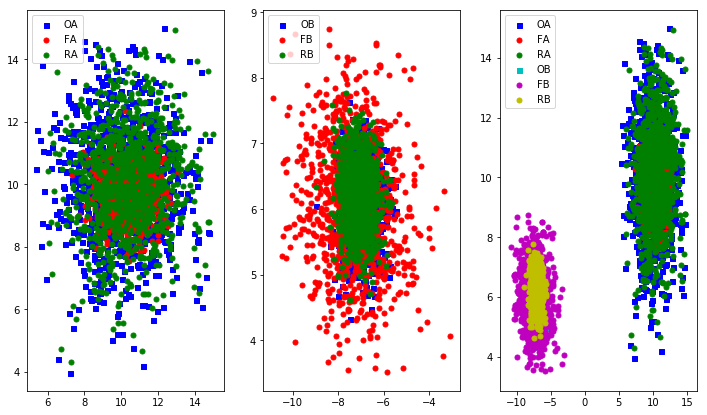

[Epoch 250/1000] [Batch 248/250] [D loss: 0.695633, acc:  31%] 
  [Translation AB Dist: 1.180826 BA Dist: 3.630432 Min AB Dist: 0.749810 Max AB: 1.473261 Min BA: 1.551234Max BA: 7.376265] 
 [G loss: 1.862625, adv: 0.695246, recon: 0.110430, id: 18.470596] time: 0:02:36.731857 
[Fake A Mean: (10, 9) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


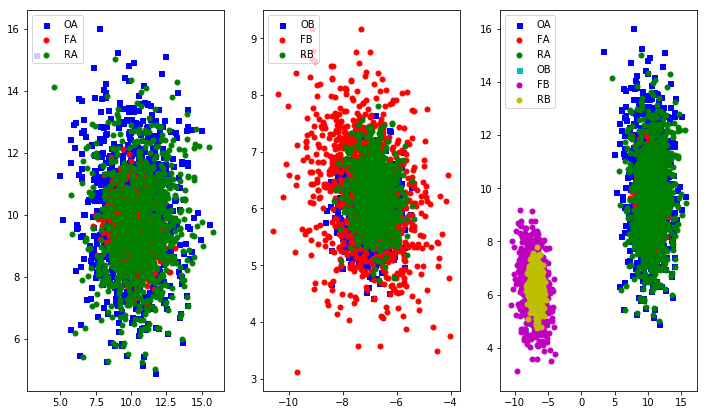

[Epoch 300/1000] [Batch 248/250] [D loss: 0.683104, acc:  31%] 
  [Translation AB Dist: 1.209471 BA Dist: 3.668021 Min AB Dist: 0.815747 Max AB: 1.497601 Min BA: 1.589776Max BA: 7.428198] 
 [G loss: 2.036889, adv: 0.703694, recon: 0.184666, id: 19.116898] time: 0:03:07.653882 
[Fake A Mean: (10, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


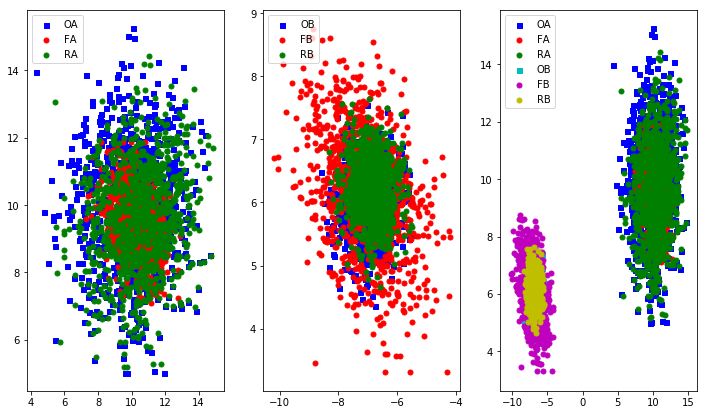

[Epoch 350/1000] [Batch 248/250] [D loss: 0.707787, acc:  31%] 
  [Translation AB Dist: 1.033461 BA Dist: 3.576698 Min AB Dist: 0.558053 Max AB: 1.447263 Min BA: 1.486042Max BA: 7.280955] 
 [G loss: 2.019073, adv: 0.667396, recon: 0.209818, id: 19.366455] time: 0:03:38.643449 
[Fake A Mean: (10, 9) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


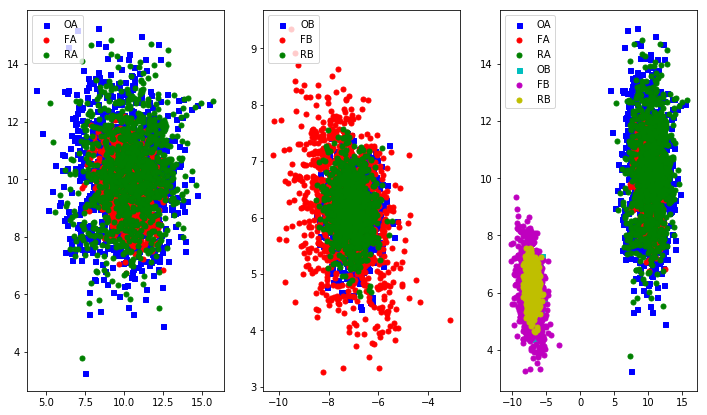

[Epoch 400/1000] [Batch 248/250] [D loss: 0.703758, acc:  31%] 
  [Translation AB Dist: 1.193075 BA Dist: 3.712407 Min AB Dist: 0.825047 Max AB: 1.401504 Min BA: 1.708940Max BA: 7.459211] 
 [G loss: 2.408162, adv: 0.677392, recon: 0.393260, id: 19.463776] time: 0:04:09.644075 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


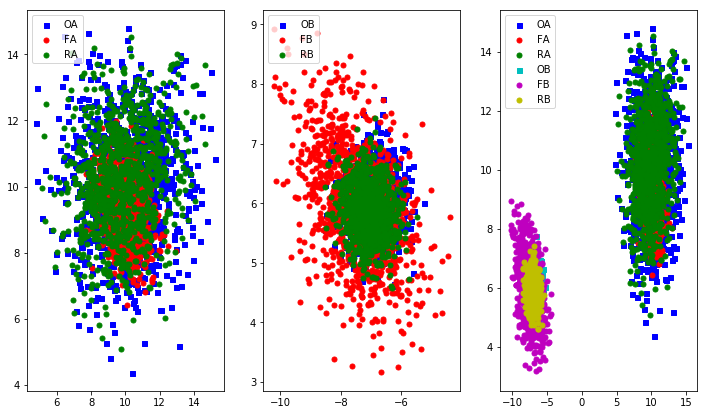

[Epoch 450/1000] [Batch 248/250] [D loss: 0.703996, acc:  31%] 
  [Translation AB Dist: 1.206098 BA Dist: 3.688315 Min AB Dist: 0.838641 Max AB: 1.409909 Min BA: 1.679452Max BA: 7.367529] 
 [G loss: 2.223946, adv: 0.671765, recon: 0.305341, id: 20.055637] time: 0:04:49.843861 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 6) B Var: 0 ]


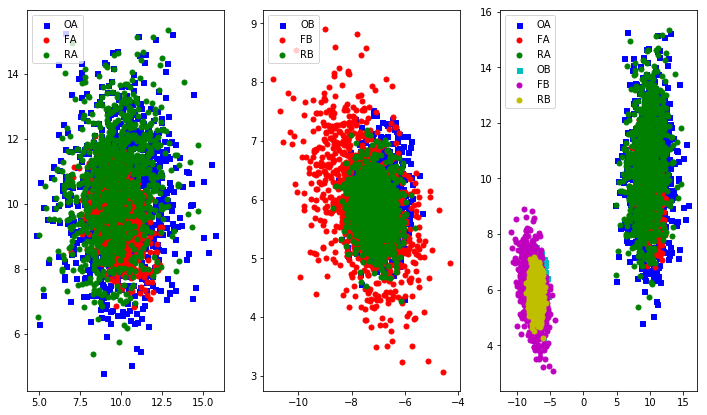

[Epoch 500/1000] [Batch 248/250] [D loss: 0.703510, acc:  31%] 
  [Translation AB Dist: 1.269462 BA Dist: 3.679899 Min AB Dist: 0.910223 Max AB: 1.521592 Min BA: 1.617104Max BA: 7.395849] 
 [G loss: 2.014639, adv: 0.654058, recon: 0.219085, id: 20.345619] time: 0:05:33.718516 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 6) B Var: 0 ]


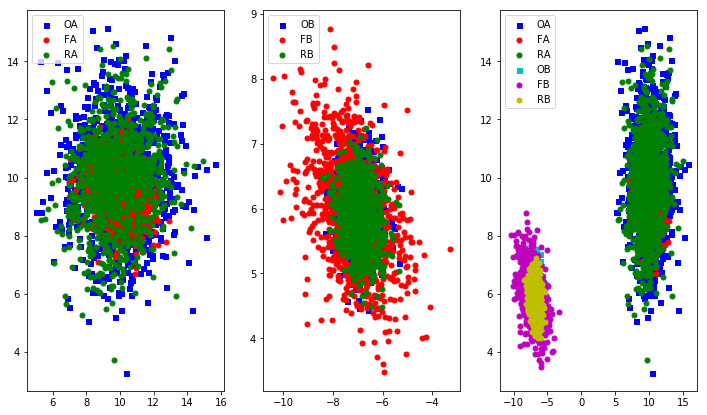

[Epoch 550/1000] [Batch 248/250] [D loss: 0.681093, acc:  56%] 
  [Translation AB Dist: 1.220169 BA Dist: 3.633005 Min AB Dist: 0.835049 Max AB: 1.557224 Min BA: 1.608158Max BA: 7.289523] 
 [G loss: 2.240472, adv: 0.690859, recon: 0.296575, id: 20.505278] time: 0:06:17.419494 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


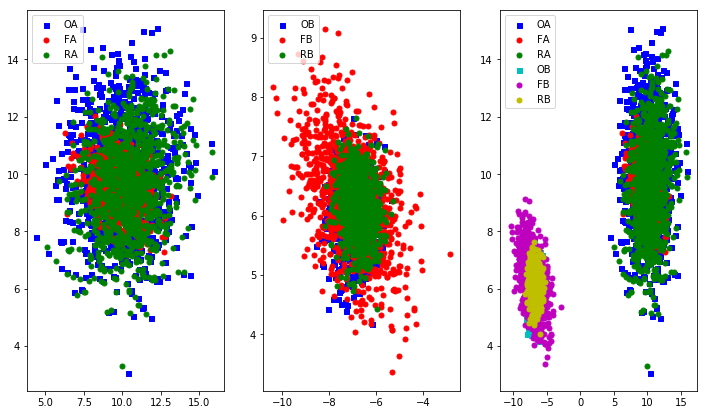

[Epoch 600/1000] [Batch 248/250] [D loss: 0.686981, acc:  56%] 
  [Translation AB Dist: 1.214819 BA Dist: 3.633617 Min AB Dist: 0.833535 Max AB: 1.536501 Min BA: 1.589553Max BA: 7.354030] 
 [G loss: 2.058537, adv: 0.709445, recon: 0.184439, id: 21.062525] time: 0:07:00.311987 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


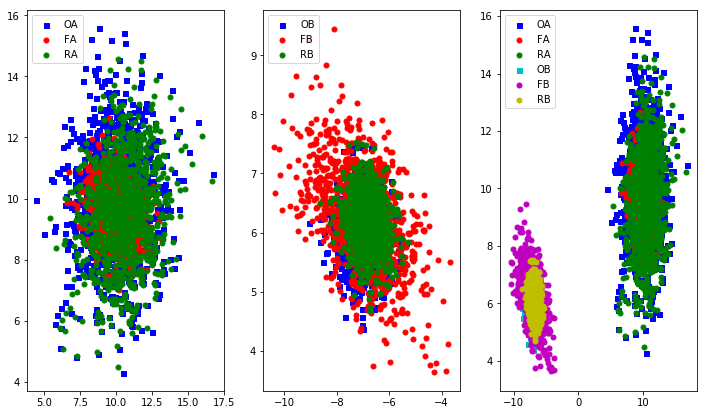

[Epoch 650/1000] [Batch 248/250] [D loss: 0.692837, acc:  56%] 
  [Translation AB Dist: 1.157501 BA Dist: 3.606159 Min AB Dist: 0.749431 Max AB: 1.453285 Min BA: 1.574243Max BA: 7.302829] 
 [G loss: 1.960556, adv: 0.704061, recon: 0.140700, id: 21.113596] time: 0:07:43.810486 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


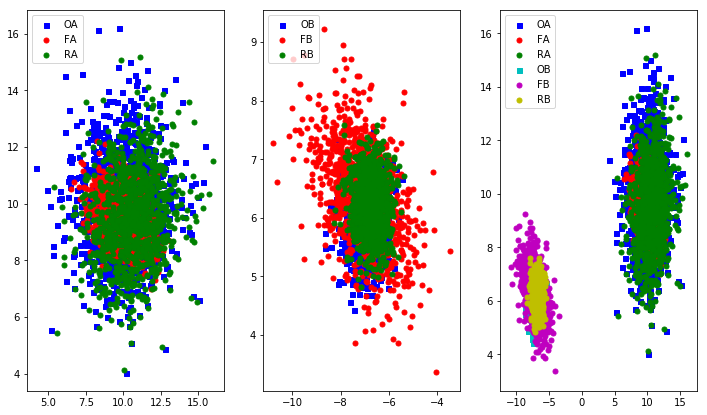

[Epoch 700/1000] [Batch 248/250] [D loss: 0.684530, acc:  62%] 
  [Translation AB Dist: 1.168394 BA Dist: 3.619837 Min AB Dist: 0.789255 Max AB: 1.447050 Min BA: 1.586847Max BA: 7.335865] 
 [G loss: 2.421122, adv: 0.702188, recon: 0.372246, id: 21.149319] time: 0:08:26.974344 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


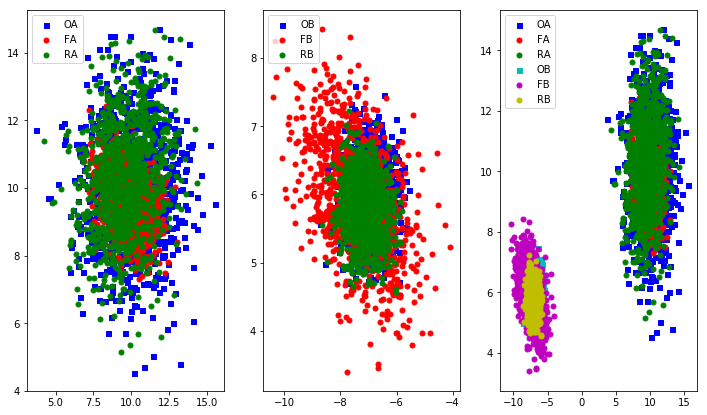

[Epoch 750/1000] [Batch 248/250] [D loss: 0.682378, acc:  62%] 
  [Translation AB Dist: 1.141104 BA Dist: 3.609854 Min AB Dist: 0.764770 Max AB: 1.434351 Min BA: 1.566020Max BA: 7.325869] 
 [G loss: 2.428054, adv: 0.703565, recon: 0.373235, id: 21.234190] time: 0:09:09.305469 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 9) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-6, 5) B Var: 0 ]


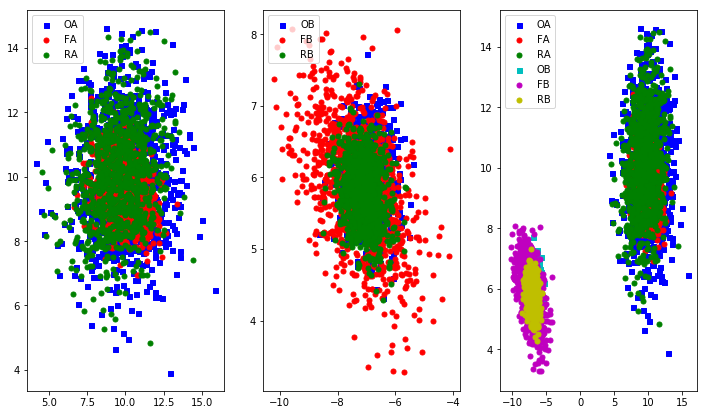

[Epoch 800/1000] [Batch 248/250] [D loss: 0.675870, acc:  62%] 
  [Translation AB Dist: 1.145318 BA Dist: 3.610704 Min AB Dist: 0.782937 Max AB: 1.441133 Min BA: 1.553835Max BA: 7.301614] 
 [G loss: 2.505624, adv: 0.708269, recon: 0.406224, id: 21.362965] time: 0:09:52.377066 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


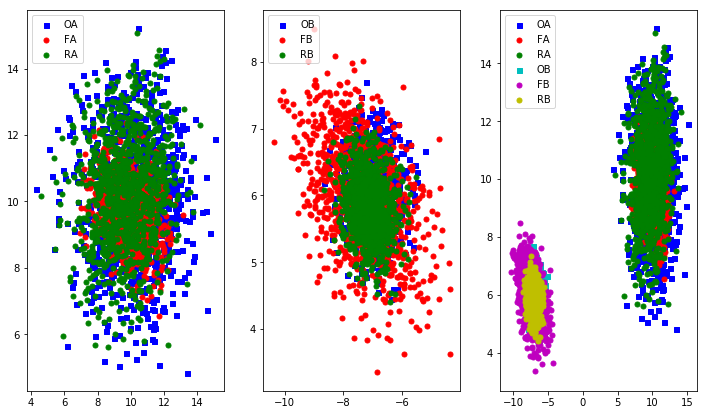

[Epoch 850/1000] [Batch 248/250] [D loss: 0.683550, acc:  56%] 
  [Translation AB Dist: 1.151376 BA Dist: 3.619674 Min AB Dist: 0.788807 Max AB: 1.393088 Min BA: 1.550665Max BA: 7.314412] 
 [G loss: 2.314940, adv: 0.698912, recon: 0.319548, id: 21.443102] time: 0:10:35.772597 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 1 B Mean: (-7, 6) B Var: 0 ]


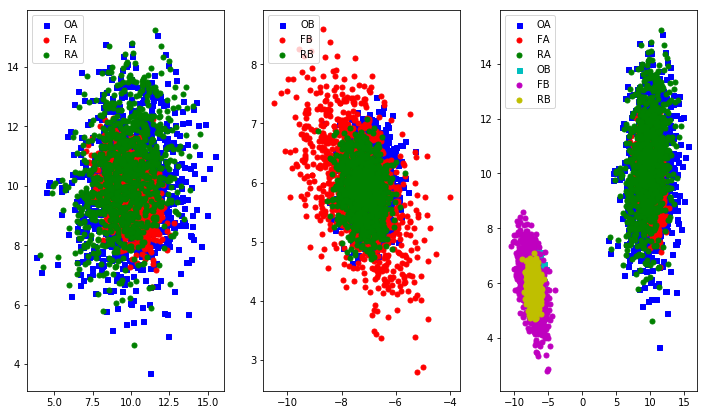

[Epoch 900/1000] [Batch 248/250] [D loss: 0.671000, acc:  62%] 
  [Translation AB Dist: 1.124476 BA Dist: 3.608300 Min AB Dist: 0.769476 Max AB: 1.419198 Min BA: 1.538037Max BA: 7.274169] 
 [G loss: 2.489356, adv: 0.716531, recon: 0.387852, id: 21.536266] time: 0:11:19.219739 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


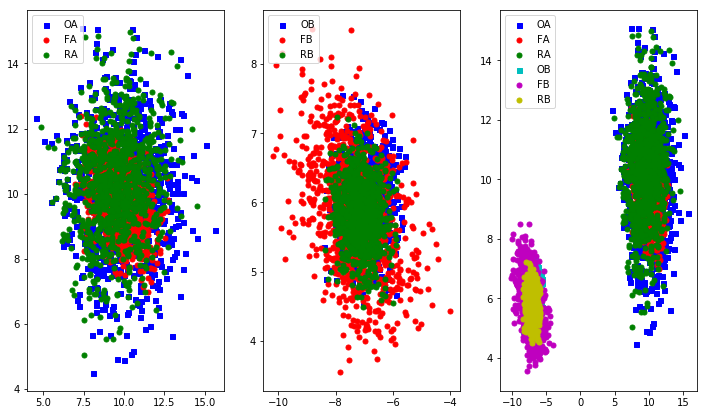

[Epoch 950/1000] [Batch 248/250] [D loss: 0.674842, acc:  62%] 
  [Translation AB Dist: 1.092829 BA Dist: 3.606395 Min AB Dist: 0.740241 Max AB: 1.404151 Min BA: 1.533716Max BA: 7.302450] 
 [G loss: 2.529011, adv: 0.712083, recon: 0.411908, id: 21.517170] time: 0:12:01.687504 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


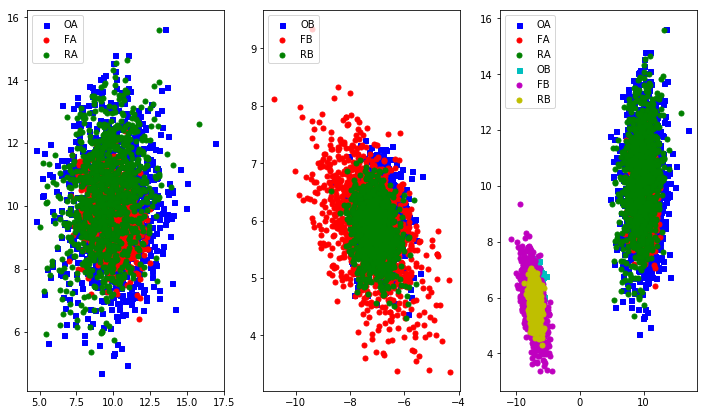

In [12]:
gan_3_depth = DeeperCycleGAN(data_A, data_B)
gan_3_depth.train(epochs=1000, batch_size=4, sample_interval=50)

In [13]:
class LinearCycleGAN():
    def __init__(self, data_A, data_B, lr_G=0.001, lr_D=0.0005, lambda_cycle=1, 
                 disclossconst=1, idloss=0.01, disclossfunc='binary_crossentropy', seed=997):
        
        #
        self.data_shape=(2,)
        self.data_dim=2
        self.disclossconst=disclossconst
        self.idloss=idloss
        self.disclossfunc=disclossfunc
        self.seed=seed

        # Loss weights
        ##################################
        # First change: set cycle-consistency weight to unit.
        # Could probably do the same to identity-loss weight
        # without much change, but the lambda_cycle weight
        # did seem to have an effect
        ##################################
        self.lambda_cycle = lambda_cycle                    # Cycle-consistency loss
        self.lambda_id = self.idloss * self.lambda_cycle    # Identity loss

        ##################################
        # Second change: optimizers
        # Start with SGD on easy data, then consider using Adam/RMSprop when you
        # get a feel for how training will go. The former is simpler and more
        # predictable, the latter can be erratic if you don't understand how to
        # set the hyperparameters.
        #
        # And then: different learning rates for generator and discriminator.
        # I'm suspicious of anyone who doesn't do this unless the discriminator
        # is non-sigmoid.
        # I'm suspicious of non-sigmoid discriminators except Wasserstein GAN.
        ##################################
        optimizer_G = SGD(lr=lr_G)
        optimizer_D = SGD(lr=lr_D)

        ##################################
        # Third change: discriminator loss
        # The original CycleGAN authors used MSE instead of BCE.
        # They cited some paper I've never heard of which claimed
        # that it encourages stability.
        # This sounds like a poor-man's Wasserstein GAN without
        # any of the analysis to back it up, FWIW.
        # Switched back to BCE because we know it works on
        # other types of GANs.
        #
        # ALSO: The discriminator's output layer had a sigmoid
        # activation, which doesn't make sense with MSE.
        # If you look in the original cyclegan.py, the
        # discriminator's final layer was the default activation,
        # which is linear. This makes more sense with MSE.
        # I also tried leaving MSE loss, and making the discriminator's
        # last activation linear, but that didn't work as well.
        ##################################
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])
        self.d_B.compile(loss=self.disclossfunc,
            optimizer=optimizer_D,
            metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------
        np.random.seed(self.seed)
        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input instances from both domains
        datum_A = Input(shape=self.data_shape)
        datum_B = Input(shape=self.data_shape)


        #Is this going to work the way I have it here
        #or should I be taking something from a batch?
        # Translate images to the other domain
        fake_B = self.g_AB(datum_A)
        fake_A = self.g_BA(datum_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        datum_A_id = self.g_BA(datum_A)
        datum_B_id = self.g_AB(datum_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        ##################################
        # Third change (part two): consistent switch to BCE
        # for all discriminator losses
        ##################################
        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[datum_A, datum_B],
                              outputs=[ valid_A, valid_B,
                                        reconstr_A, reconstr_B,
                                        datum_A_id, datum_B_id ])
        self.combined.compile(loss=[self.disclossfunc, self.disclossfunc,
                                    'mae', 'mae',
                                    'mae', 'mae'],
                            loss_weights=[  self.disclossconst, self.disclossconst,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id ],
                            optimizer=optimizer_G)

    

    def build_generator(self):
        """
        Simple MLP generator for the MoG unrolled GAN toy experiment
        """

        gen_input = Input(shape=(self.data_dim,), name="generator_input")

        ##################################
        # Fourth change: made this tanh instead of relu.
        # I suspect the important thing is to have similar activations
        # in generator and discriminator, but who knows.
        # Could also try relu in both, but I would use LeakyReLU.
        ##################################
        x = Dense(2*self.data_dim)(gen_input)
        x = Activation("tanh")(x)
        x = Dense(2)(gen_input)
        

        generator_model = Model(inputs=[gen_input], outputs=[x])
        #visualize_model(generator_model)

        return generator_model

#        
    def build_discriminator(self):

        """
        Simple MLP discriminator for the MoG unrolled GAN toy experiment
        """

        disc_input = Input(shape=(2,), name="discriminator_input")

        x = Dense(2*self.data_dim)(disc_input)
        x = Activation("tanh")(x)
    #     for i in range(2):
        x = Dense(2*self.data_dim)(x)
        x = Activation("tanh")(x)
        x = Dense(1, activation="sigmoid")(x)

        discriminator_model = Model(inputs=[disc_input], outputs=[x])
        #visualize_model(discriminator_model)

        #is there a difference between what this returns and the original cycelgan does?
        return discriminator_model

    
    def train(self, epochs, batch_size=1, sample_interval=50):

        start_time = datetime.datetime.now()
        np.random.seed(self.seed)

        # Adversarial loss ground truths
        valid = np.ones((batch_size,)) #+ self.disc_patch)
        fake = np.zeros((batch_size,)) #+ self.disc_patch)
#         self.g_AB.summary()
#         self.g_BA.summary()
#         self.d_A.summary()
#         self.d_B.summary()
        self.n_batches = int(min(len(data_A), len(data_B)) / batch_size)
        #total_samples = self.n_batches * batch_size
        for epoch in range(epochs):
            for i in range(self.n_batches-1):
                #randomly shuffle data?
                
                #take the corresponding "Batch size" number of elements
                batch_A = data_A[i*batch_size:(i+1)*batch_size]
                batch_B = data_B[i*batch_size:(i+1)*batch_size]
                #put them through this thing
                
                
                # ----------------------
                #  Train Discriminators
                # ----------------------
               # print(imgs_A.shape)

                # Translate images to opposite domain
                fake_B = self.g_AB.predict(batch_A)
                fake_A = self.g_BA.predict(batch_B)
                #print(fake_A.shape)
                #print(fake_B.shape)
                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(batch_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(batch_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)


                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([batch_A, batch_B],
                                                        [valid, valid,
                                                        batch_A, batch_B,
                                                        batch_A, batch_B])

                elapsed_time = datetime.datetime.now() - start_time
                
                #question: when you call predict on a generator, does it return elements
                #in the same order you send them in?
                #because i'm assuming here that fake_a[i] will correspond to batch_b[i]. IS this true?
                #until I know, I'll stick to batch size 1 always
                translation_acc_AB=np.asarray([])
                translation_acc_BA=np.asarray([])
                translation_max_BA=np.asarray([])
                translation_min_AB=np.asarray([])
                #computes the average euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_acc_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()))
                translation_acc_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()))
                
                #computes the minimum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_min_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).min()))
                translation_min_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).min()))
                
                #computes the maximum euclidean distance between a-->translated->b, 
                #and the corresponding point that cyclegan generated 
                translation_max_AB=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(a, (10,10), 3, (-7,6), .25)), bf) for (a,bf) in zip(batch_A, fake_B) ]).max()))
                translation_max_BA=np.append(translation_acc_AB, (np.asarray(
                    [scipy.spatial.distance.euclidean(
                        (translate_pt(b, (-7,6), .25, (10,10), 3)), af) for (b,af) in zip(batch_B, fake_A) ]).max()))
    
                # Plot the progress
            if epoch % sample_interval == 0:
                print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] \n  [Translation AB Dist: %f BA Dist: %f Min AB Dist: %f Max AB: %f Min BA: %fMax BA: %f] \n [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                                                                        % ( epoch, epochs,
                                                                            i, self.n_batches,
                                                                            d_loss[0], 100*d_loss[1],
                                                                            np.asarray(translation_acc_AB).mean(),
                                                                            np.asarray(translation_acc_BA).mean(),
                                                                            np.asarray(translation_min_AB).mean(),
                                                                            np.asarray(translation_max_AB).mean(),
                                                                            np.asarray(translation_min_BA).mean(),
                                                                            np.asarray(translation_max_BA).mean(),
                                                                            g_loss[0], 
                                                                            np.mean(g_loss[1:3]),
                                                                            np.mean(g_loss[3:5]),
                                                                            np.mean(g_loss[5:6]),
                                                                            elapsed_time))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_data(epoch, i)

    def sample_data(self, epoch, batch_i):
       # r, c = 2, 3

        orig2, pic_data_A, pic_data_B= gen_data((10,10), 3, (-7,6), .25, 1000)
        
    
        # Translate images to the other domain
        fake_B = self.g_AB.predict(pic_data_A)
        fake_A = self.g_BA.predict(pic_data_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)
        
        #give the translation accuracy for a random element
        #I'm not doing the average because I'm not sure the fake and real correspond 1-1
        #I can change this later if I think they do
        num=np.random.randint(len(fake_A[0]))
        trans_acc_AB= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_A[num])), fake_B[num])])
        trans_acc_BA= np.asarray(
                    [scipy.spatial.distance.euclidean((translate_pt(pic_data_B[num])), fake_A[num])])
#         translation_acc_AB.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(a)), bf) for (a,bf) in zip(batch_A, fake_B) ]).mean()
#         translation_acc_BA.append= np.asarray(
#                     [scipy.spatial.distance.euclidean((translate_pt(b)), af) for (b,af) in zip(batch_B, fake_A) ]).mean()
    
        #print("[Trans Dist AB: %d Dist: %d]" \ %(trans_acc_AB, trans_acc_BA))
        
        
        #means and variances
        #(are vars computed right? I did it along one axis because I think they're the same on both) 
        #for real and generated distributions
        fakeA_mean=[np.mean(np.asarray(fake_A[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeA_var=np.asarray(fake_A[:,0]).var()
        realA_mean=[np.mean(np.asarray(pic_data_A[:,0])), np.mean(np.asarray(pic_data_A[:,1]))]
        realA_var=np.asarray(pic_data_A[:,0]).var()
        print("[Fake A Mean: (%d, %d) Fake A Var: %d A Mean: (%d, %d) A Var: %d ]"  
              %(fakeA_mean[0], fakeA_mean[1], fakeA_var, realA_mean[0], realA_mean[1], realA_var))
        
        fakeB_mean=[np.mean(np.asarray(fake_B[:,0])), np.mean(np.asarray(fake_A[:,1]))]
        fakeB_var=np.asarray(fake_B[:,0]).var()
        realB_mean=[np.mean(np.asarray(pic_data_B[:,0])), np.mean(np.asarray(pic_data_B[:,1]))]
        realB_var=np.asarray(pic_data_B[:,0]).var()
        print("[Fake B Mean: (%d, %d) Fake B Var: %d B Mean: (%d, %d) B Var: %d ]"  
              %(fakeB_mean[0], fakeB_mean[1], fakeB_var, realB_mean[0], realB_mean[1], realB_var))
        
        fig = plt.figure(figsize=(12,7))
        ax1 = fig.add_subplot(131)

        ax1.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax1.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax1.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        plt.legend(loc='upper left');
        
        ax2=fig.add_subplot(132)
        ax2.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='b', marker="s", label='OB')
        ax2.scatter(fake_B[:,0], fake_B[:,1], s=25, c='r', marker="o", label='FB')
        ax2.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='g', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        ax3=fig.add_subplot(133)
        ax3.scatter(pic_data_A[:, 0], pic_data_A[:,1], s=25, c='b', marker="s", label='OA')
        ax3.scatter(fake_A[:,0], fake_A[:,1], c='r', s=25, marker="o", label='FA')
        ax3.scatter(reconstr_A[:,0], reconstr_A[:,1], s=25, c='g', marker="o", label='RA')
        ax3.scatter(pic_data_B[:, 0], pic_data_B[:,1], s=25, c='c', marker="s", label='OB')
        ax3.scatter(fake_B[:,0], fake_B[:,1], s=25, c='m', marker="o", label='FB')
        ax3.scatter(reconstr_B[:,0], reconstr_B[:,1], s=25, c='y', marker="o", label='RB')
        plt.legend(loc='upper left');
        
        plt.show()
        plt.clf()
        fig.savefig("images/%d_%d.png" % (epoch, batch_i))
        plt.close()

[Epoch 0/1000] [Batch 248/250] [D loss: 0.772749, acc:  50%] 
  [Translation AB Dist: 3.022324 BA Dist: 5.732254 Min AB Dist: 2.213146 Max AB: 3.951968 Min BA: 2.247961Max BA: 9.308968] 
 [G loss: 4.196993, adv: 1.042328, recon: 0.946943, id: 8.728788] time: 0:00:02.507283 
[Fake A Mean: (7, 5) Fake A Var: 0 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-8, 5) Fake B Var: 3 B Mean: (-7, 6) B Var: 0 ]


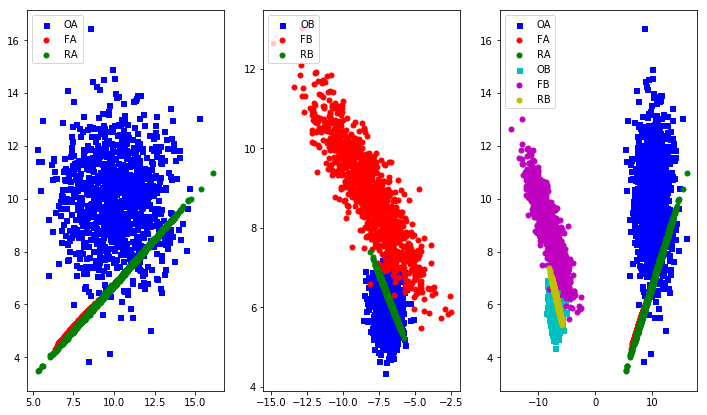

[Epoch 50/1000] [Batch 248/250] [D loss: 0.695276, acc:  56%] 
  [Translation AB Dist: 1.600952 BA Dist: 3.744150 Min AB Dist: 1.065126 Max AB: 1.918285 Min BA: 1.701730Max BA: 7.126533] 
 [G loss: 2.103016, adv: 0.691922, recon: 0.277590, id: 8.300018] time: 0:00:43.998417 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 3 B Mean: (-7, 5) B Var: 0 ]


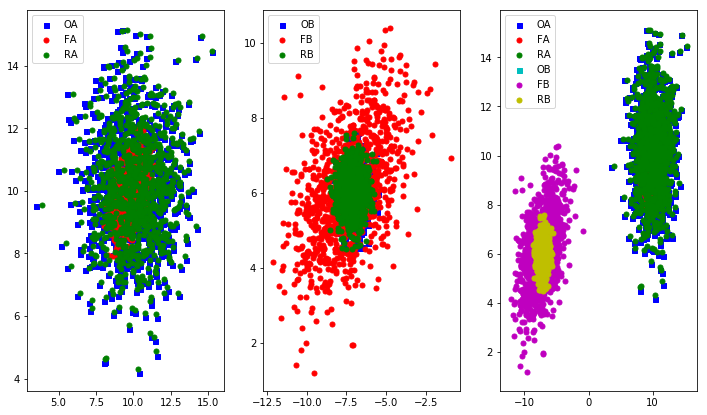

[Epoch 100/1000] [Batch 248/250] [D loss: 0.673154, acc:  75%] 
  [Translation AB Dist: 1.981198 BA Dist: 4.147901 Min AB Dist: 1.457762 Max AB: 2.396644 Min BA: 2.099886Max BA: 7.308896] 
 [G loss: 2.101731, adv: 0.720764, recon: 0.240182, id: 11.635532] time: 0:01:24.080198 
[Fake A Mean: (8, 8) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-8, 8) Fake B Var: 1 B Mean: (-7, 5) B Var: 0 ]


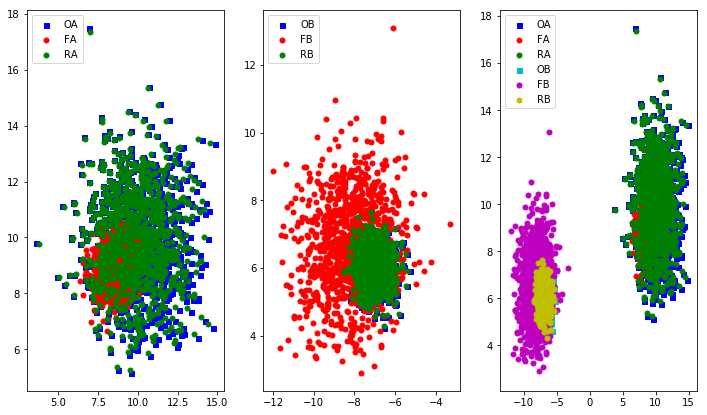

[Epoch 150/1000] [Batch 248/250] [D loss: 0.659870, acc:  68%] 
  [Translation AB Dist: 1.495093 BA Dist: 3.814940 Min AB Dist: 1.162101 Max AB: 1.832541 Min BA: 1.963546Max BA: 6.993276] 
 [G loss: 1.983508, adv: 0.764469, recon: 0.122096, id: 15.599173] time: 0:02:07.471061 
[Fake A Mean: (9, 9) Fake A Var: 0 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


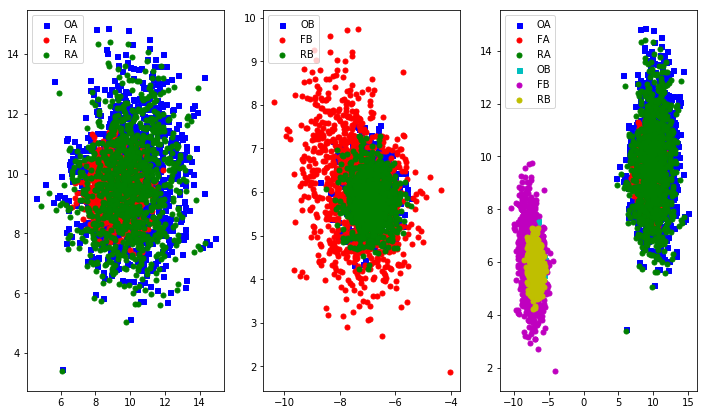

[Epoch 200/1000] [Batch 248/250] [D loss: 0.666172, acc:  68%] 
  [Translation AB Dist: 1.318794 BA Dist: 3.706418 Min AB Dist: 0.925883 Max AB: 1.595622 Min BA: 1.666761Max BA: 6.919929] 
 [G loss: 2.038387, adv: 0.747275, recon: 0.154497, id: 18.492744] time: 0:02:49.977334 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


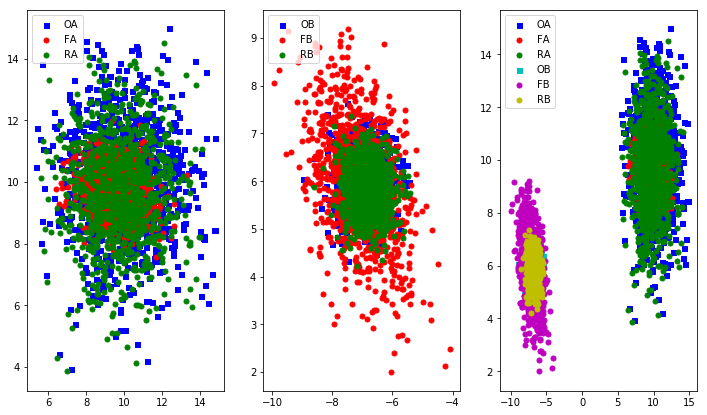

[Epoch 250/1000] [Batch 248/250] [D loss: 0.675017, acc:  62%] 
  [Translation AB Dist: 1.250367 BA Dist: 3.675908 Min AB Dist: 0.837007 Max AB: 1.543870 Min BA: 1.590902Max BA: 6.879500] 
 [G loss: 1.993669, adv: 0.734675, recon: 0.139112, id: 19.847103] time: 0:03:32.818149 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


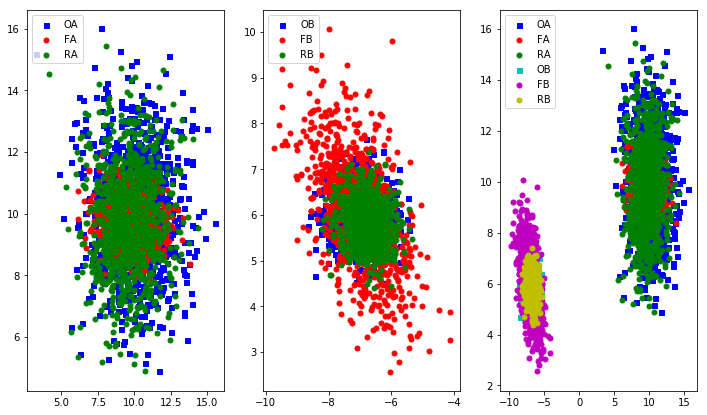

[Epoch 300/1000] [Batch 248/250] [D loss: 0.677600, acc:  56%] 
  [Translation AB Dist: 1.166017 BA Dist: 3.638390 Min AB Dist: 0.722292 Max AB: 1.492792 Min BA: 1.566664Max BA: 6.824485] 
 [G loss: 2.181758, adv: 0.739114, recon: 0.227951, id: 20.079035] time: 0:04:16.179445 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


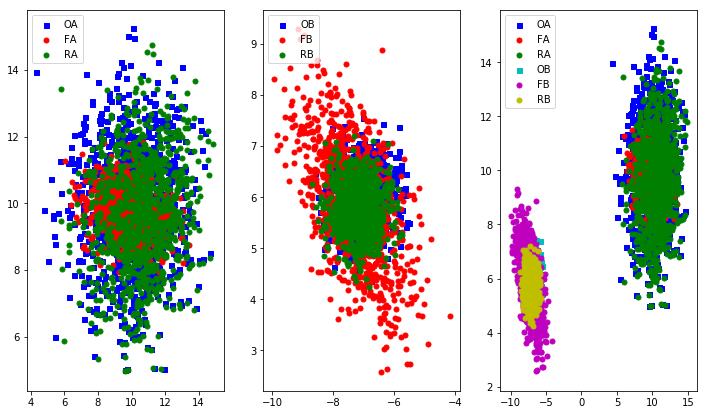

[Epoch 350/1000] [Batch 248/250] [D loss: 0.667025, acc:  56%] 
  [Translation AB Dist: 1.271397 BA Dist: 3.691237 Min AB Dist: 0.893155 Max AB: 1.539107 Min BA: 1.596177Max BA: 6.919359] 
 [G loss: 2.567487, adv: 0.738120, recon: 0.421772, id: 20.076145] time: 0:04:59.944132 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


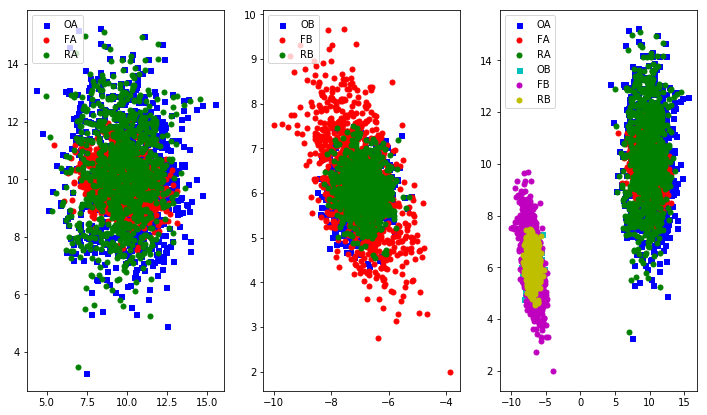

[Epoch 400/1000] [Batch 248/250] [D loss: 0.669776, acc:  56%] 
  [Translation AB Dist: 1.258020 BA Dist: 3.675927 Min AB Dist: 0.879981 Max AB: 1.523855 Min BA: 1.571903Max BA: 6.888301] 
 [G loss: 2.499133, adv: 0.733146, recon: 0.392664, id: 20.054390] time: 0:05:43.595762 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


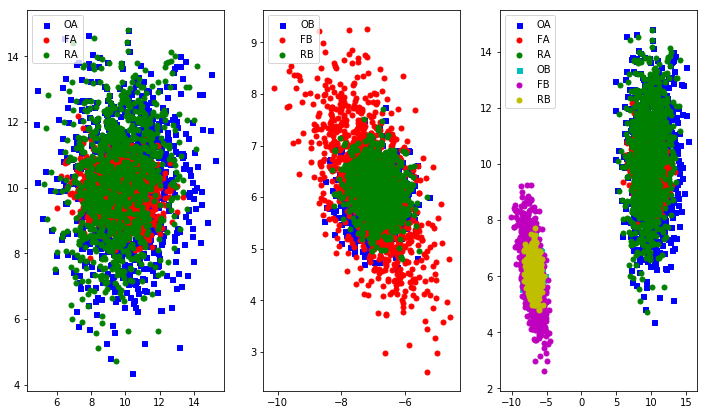

[Epoch 450/1000] [Batch 248/250] [D loss: 0.669084, acc:  56%] 
  [Translation AB Dist: 1.246250 BA Dist: 3.672974 Min AB Dist: 0.865447 Max AB: 1.521057 Min BA: 1.558062Max BA: 6.924098] 
 [G loss: 2.562171, adv: 0.732446, recon: 0.425294, id: 19.992552] time: 0:06:26.139892 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


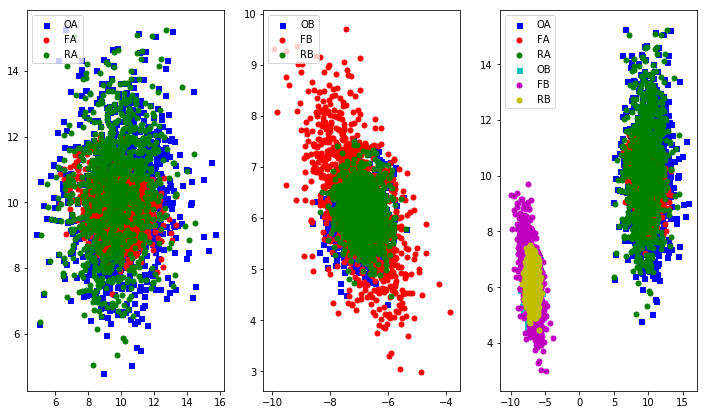

[Epoch 500/1000] [Batch 248/250] [D loss: 0.678248, acc:  56%] 
  [Translation AB Dist: 1.097896 BA Dist: 3.586556 Min AB Dist: 0.643199 Max AB: 1.449876 Min BA: 1.473835Max BA: 6.787933] 
 [G loss: 2.017718, adv: 0.723201, recon: 0.161982, id: 19.986168] time: 0:07:09.318236 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 9) A Var: 2 ]
[Fake B Mean: (-7, 9) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


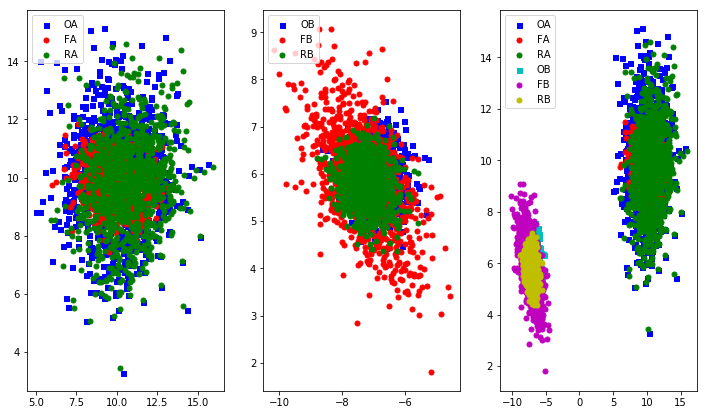

[Epoch 550/1000] [Batch 248/250] [D loss: 0.672645, acc:  56%] 
  [Translation AB Dist: 1.185041 BA Dist: 3.625062 Min AB Dist: 0.798476 Max AB: 1.524792 Min BA: 1.504911Max BA: 6.828133] 
 [G loss: 2.379427, adv: 0.722674, recon: 0.344063, id: 19.882877] time: 0:07:52.870169 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


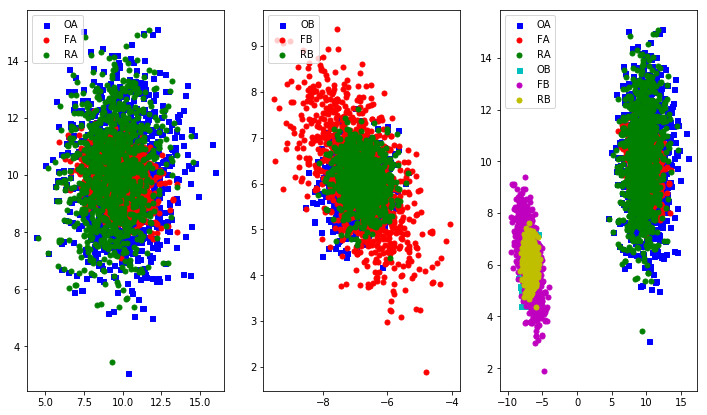

[Epoch 600/1000] [Batch 248/250] [D loss: 0.673089, acc:  56%] 
  [Translation AB Dist: 1.177411 BA Dist: 3.619842 Min AB Dist: 0.788542 Max AB: 1.526030 Min BA: 1.483661Max BA: 6.851707] 
 [G loss: 2.413960, adv: 0.719882, recon: 0.364957, id: 19.770203] time: 0:08:35.728975 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 2 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


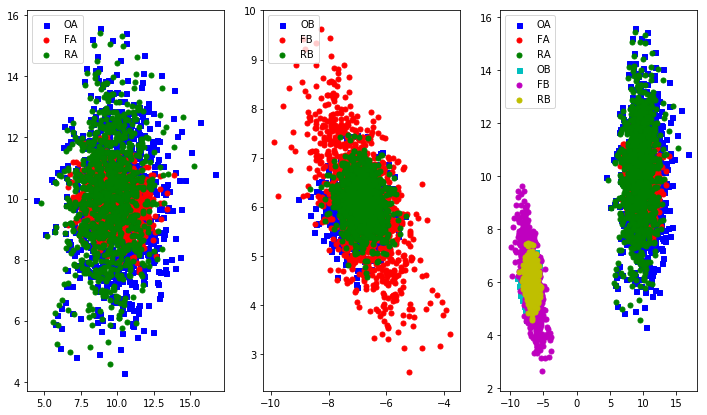

[Epoch 650/1000] [Batch 248/250] [D loss: 0.673017, acc:  56%] 
  [Translation AB Dist: 1.174647 BA Dist: 3.610623 Min AB Dist: 0.795295 Max AB: 1.524264 Min BA: 1.469399Max BA: 6.825343] 
 [G loss: 2.432258, adv: 0.721782, recon: 0.372145, id: 19.722179] time: 0:09:18.885340 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


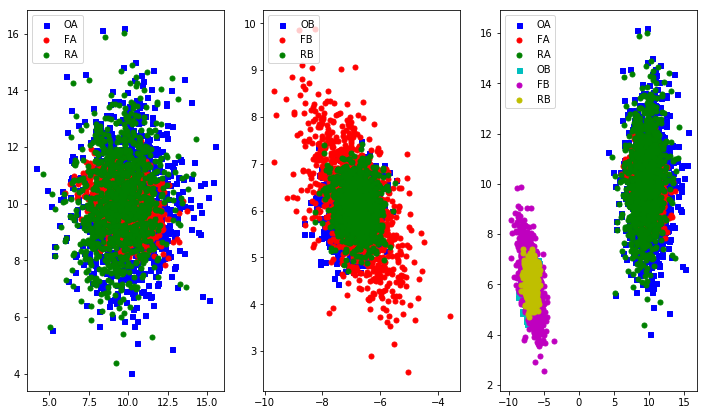

[Epoch 700/1000] [Batch 248/250] [D loss: 0.673578, acc:  56%] 
  [Translation AB Dist: 1.168002 BA Dist: 3.601102 Min AB Dist: 0.786135 Max AB: 1.522301 Min BA: 1.452270Max BA: 6.812454] 
 [G loss: 2.399936, adv: 0.719542, recon: 0.358963, id: 19.609621] time: 0:10:02.750658 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


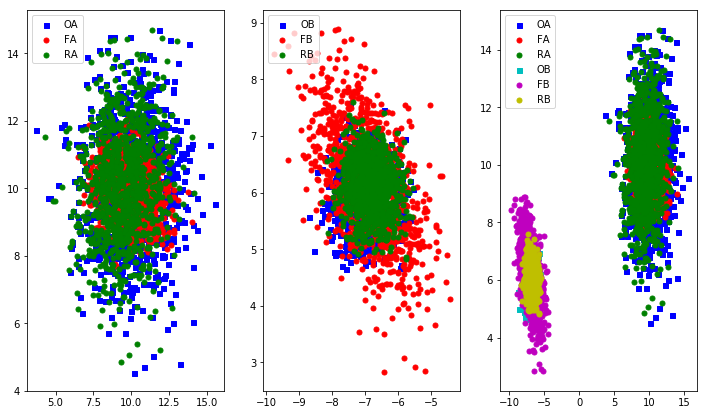

[Epoch 750/1000] [Batch 248/250] [D loss: 0.674295, acc:  56%] 
  [Translation AB Dist: 1.159034 BA Dist: 3.595169 Min AB Dist: 0.776619 Max AB: 1.522376 Min BA: 1.450002Max BA: 6.804294] 
 [G loss: 2.385066, adv: 0.717433, recon: 0.354042, id: 19.541576] time: 0:10:46.093080 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (9, 9) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


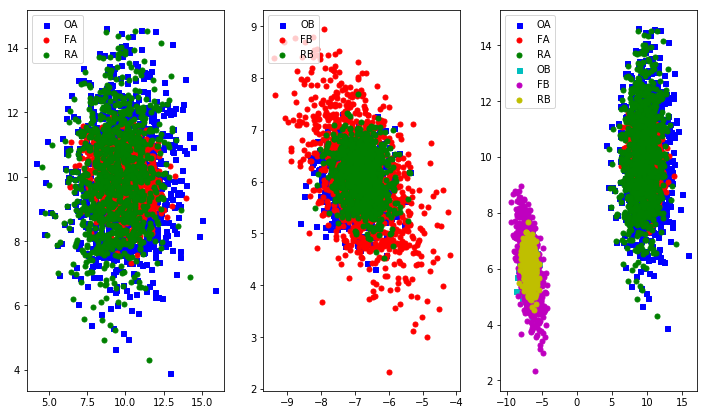

[Epoch 800/1000] [Batch 248/250] [D loss: 0.677226, acc:  56%] 
  [Translation AB Dist: 1.144674 BA Dist: 3.581306 Min AB Dist: 0.758683 Max AB: 1.501131 Min BA: 1.429534Max BA: 6.784829] 
 [G loss: 2.303118, adv: 0.709194, recon: 0.321921, id: 19.367710] time: 0:11:29.498442 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 10) A Var: 2 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-7, 5) B Var: 0 ]


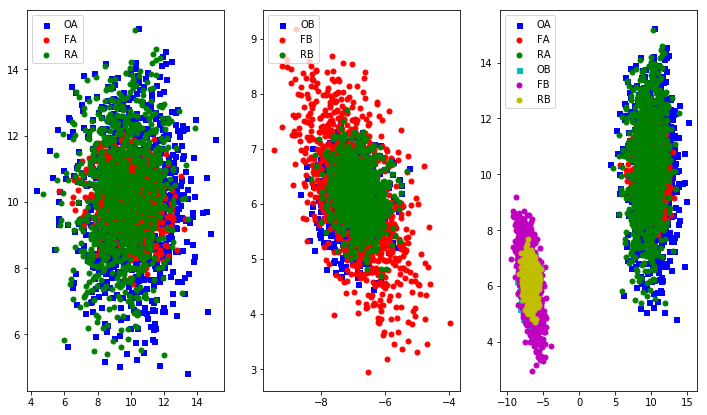

[Epoch 850/1000] [Batch 248/250] [D loss: 0.673970, acc:  56%] 
  [Translation AB Dist: 1.160570 BA Dist: 3.587359 Min AB Dist: 0.785835 Max AB: 1.519967 Min BA: 1.433329Max BA: 6.790771] 
 [G loss: 2.428326, adv: 0.721338, recon: 0.372473, id: 19.374584] time: 0:12:12.461693 
[Fake A Mean: (9, 9) Fake A Var: 1 A Mean: (10, 9) A Var: 3 ]
[Fake B Mean: (-6, 9) Fake B Var: 0 B Mean: (-7, 6) B Var: 0 ]


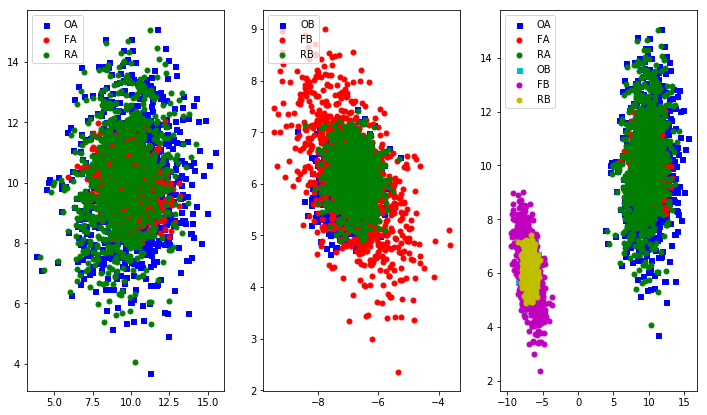

[Epoch 900/1000] [Batch 248/250] [D loss: 0.673968, acc:  56%] 
  [Translation AB Dist: 1.155015 BA Dist: 3.577224 Min AB Dist: 0.790410 Max AB: 1.527475 Min BA: 1.429980Max BA: 6.749581] 
 [G loss: 2.410064, adv: 0.720676, recon: 0.364421, id: 19.261543] time: 0:12:56.094721 
[Fake A Mean: (9, 10) Fake A Var: 1 A Mean: (9, 10) A Var: 2 ]
[Fake B Mean: (-6, 10) Fake B Var: 0 B Mean: (-6, 6) B Var: 0 ]


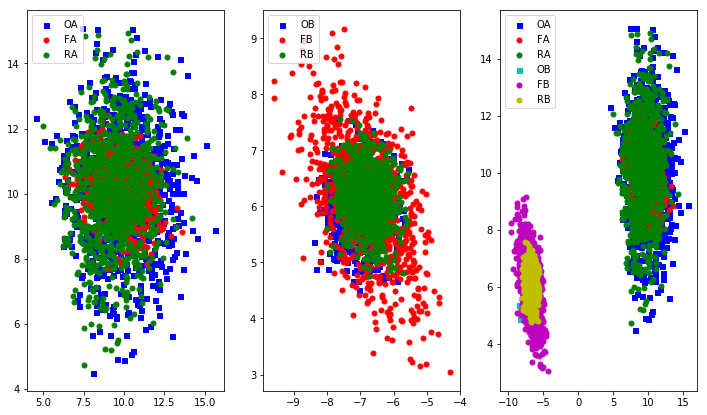

[Epoch 950/1000] [Batch 248/250] [D loss: 0.672020, acc:  56%] 
  [Translation AB Dist: 1.173954 BA Dist: 3.580282 Min AB Dist: 0.811265 Max AB: 1.520306 Min BA: 1.411865Max BA: 6.764727] 
 [G loss: 2.485535, adv: 0.725573, recon: 0.397677, id: 19.206253] time: 0:13:39.770799 
[Fake A Mean: (9, 10) Fake A Var: 1 A Mean: (9, 10) A Var: 3 ]
[Fake B Mean: (-6, 10) Fake B Var: 0 B Mean: (-6, 5) B Var: 0 ]


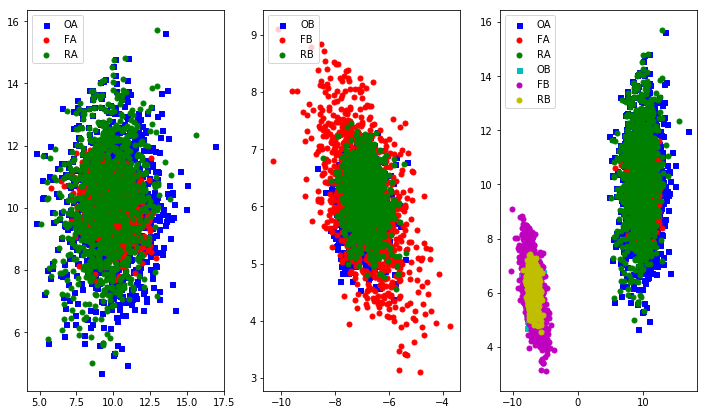

In [14]:
gan_linear= LinearCycleGAN(data_A, data_B)
gan_linear.train(epochs=1000, batch_size=4, sample_interval=50)